# Tutorial of AquaCrop.jl

In this tutorial we show how to tunne `AquaCrop.jl` to field data of yield over the years.
We use the data provided by RDWD [1] and Thüringer Landesamt für Statistik [2].

## Setup

We load the libraries that we will need for this tutorial. 
Note that `CropGrowthTutorial` is in the `src/` folder of this repository.
We use `DrWatson` through the repository for reproductibility.

In [1]:
using DrWatson
@quickactivate "CropGrowthTutorial"
#using Revise
using AquaCrop
using CropGrowthTutorial
using Dates
using DataFrames
using Unitful
using CairoMakie

[ Info: Precompiling CropGrowthTutorial [7418d300-0be8-5953-8050-acd19e8ee405]


## Introduction

To make simulation of crop growth using `AquaCrop.jl` we need the following data
1. Climate data
1. Soil type
1. Crop type
1. Sowing date

Additionaly we can have add more information, like sowing density, phenology dates, field data, that allows us to calibrate our crop for the specific region that we have.

In our specific case we use data from [1] and [2], from which we have data about:
1. Crop type
1. Soil type
1. Sowing density
1. Climate data
1. Yield per crop type
1. Phenology phases dates per crop type

In [2]:
# Stations information
stations_df = CropGrowthTutorial.get_phenology_stations()

Row,stations_phenology_id,description,station_name,soil_type
,Int64,String,String31,String15?
1,15215,Eichsfeld = 2925,Eichsfeld,missing
2,14233,Hohenlohe = 3761,Hohenlohe,missing
3,10705,Bodensee = 6263,Bodensee,missing
4,10536,Oberrhein = 5275,Oberrhein,missing
5,7650,"Neustadt = 3897, 2950",Neustadt,missing
6,11220,"Ergolding = 13710, 2831",Ergolding,missing
7,19732,Jena (SHK): Großbockedra [19732] = 2444,Jena,silty clay
8,15460,Thüringer Becken (UHK): **Dachwig [15460]** = 896,Thuringer_Becken,loam


In [3]:
# Crop type general information
general_crop_data_df = CropGrowthTutorial.get_crop_parameters()

Row,crop_type,aquacrop_name,plantingdens
,String15,String15,Int64
1,winter_barley,barleyGDD,3060000
2,silage_maize,maizeGDD,117000
3,winter_rape,rapeseedGDD,675000
4,winter_wheat,wheatGDD,3600000


for a given station we can see the climate data

In [4]:
station_name = "Thuringer_Becken"; # Select a station's short_name

# Climate data for a given station
uhk_clim_df =  CropGrowthTutorial.get_climate_data(station_name);
uhk_clim_df |> head

Row,date,precipitation,max_temperature,min_temperature,potential_evapotranspiration
,Date,Float64,Float64,Float64,Float64
1,1992-01-01,0.0,2.6,-1.0,0.5
2,1992-01-02,0.0,5.5,2.0,0.7
3,1992-01-03,0.0,6.2,0.5,1.2
4,1992-01-04,0.4,7.9,3.6,1.3
5,1992-01-05,7.6,9.3,4.0,0.6


where the minimal climatedata required for `AquaCrop.jl` are daily:
1. Precipitation (mm/day).
2. Maximal temperature (C).
3. Minimal temperature (C).
4. Potential Evapotranspiration (mm/day)  given by the FAO-Penman-Monteith equation.

We can also see the recorded yield data   

In [5]:
# Field yield data for a given station
uhk_yield_df = CropGrowthTutorial.get_yield_data(station_name);
uhk_yield_df |> head

Row,crop_type,unit,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
,String15,String3,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,silage_maize,dt,514.5,495.0,479.6,489.4,391.4,451.5,437.8,388.2,499.9,379.7,460.6,397.3,427.8,470.9,388.7,459.9,320.9,350.3,508.9,278.8,381.1,408.0,501.9,318.4,374.9
2,winter_barley,dt,70.0,66.3,69.8,62.3,53.7,72.2,63.4,63.7,62.0,68.5,75.5,75.0,56.3,61.0,75.4,80.4,69.1,83.4,74.0,65.6,75.7,64.1,81.4,81.2,77.7
3,winter_rape,dt,38.7,36.1,39.4,30.1,28.7,39.0,37.4,36.5,33.7,35.9,43.0,37.3,33.9,39.3,39.0,46.1,37.6,40.7,30.9,29.4,31.0,35.9,35.6,37.3,37.2
4,winter_wheat,dt,76.4,73.9,79.0,62.3,62.7,81.7,73.7,69.6,67.9,81.0,79.8,68.6,67.3,72.0,81.7,88.0,71.7,88.9,80.6,68.7,75.9,79.3,75.7,81.3,80.7


For a given crop type we have some phenology data recorded too

In [6]:
crop_type = "silage_maize"; # Select a crop_type 

# Crop's phenology raw data for a given station
maize_phenology_raw_df = CropGrowthTutorial.get_crop_phenology_data(crop_type, station_name);
maize_phenology_raw_df |> head

Row,stations_id,referenzjahr,qualitaetsniveau,objekt_id,phase_id,eintrittsdatum,eintrittsdatum_qb,jultag
,Int64,Int64,Int64,Int64,Int64,Int64,Int64,Int64
1,15460,2014,7,210,39,20140910,1,253
2,15460,2015,7,210,5,20150717,1,198
3,15460,2015,7,210,10,20150429,1,119
4,15460,2015,7,210,12,20150512,1,132
5,15460,2015,7,210,19,20150813,1,225


a simple simulation with AquaCrop's default parameters can be done like this

In [7]:
# get the soil_type for the given station
soil_type = filter(row -> row.station_name==station_name, stations_df)[1,:soil_type];

# get the aquacrop_name for the given crop_type
crop_name = filter(row -> row.crop_type==crop_type, general_crop_data_df)[1,:aquacrop_name];

# select a date for the sowing simulation
sowing_date = Date("2015-04-29");

# run a simulation
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# the daily result of the simulation
cropfield.dayout |> head      

# note that the simulation starts before the sowing_date.
# this is controlled by the parameter CropGrowthTutorial.days_before_sowing = 7 days


SIMULATION WENT WELL



Row,RunNr,Date,DAP,Stage,WC(),Rain,Irri,Surf,Infilt,RO,Drain,CR,Zgwt,Ex,E,E/Ex,Trx,Tr,Tr/Trx,ETx,ET,ET/ETx,GD,Z,StExp,StSto,StSen,StSalt,StWeed,CC,CCw,StTr,Kc(Tr),TrW,WP,Biomass,HI,Y(dry),Y(fresh),Brelative,WPet,Bin,Bout,Wr(),Wr,Wr(SAT),Wr(FC),Wr(exp),Wr(sto),Wr(sen),Wr(PWP),SaltIn,SaltOut,SaltUp,Salt(),SaltZ,ECe,ECsw,StSalt_,ECgw,WC_1,WC_2,WC_3,WC_4,WC_5,WC_6,WC_7,WC_8,WC_9,WC_10,WC_11,WC_12,ECe_1,ECe_2,ECe_3,ECe_4,ECe_5,ECe_6,ECe_7,ECe_8,ECe_9,ECe_10,ECe_11,ECe_12,ETo,Tmin,Tavg,Tmax,CO2,GDD
,Int64,Date,Int64,Int64,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Float64,Quantity…,Quantity…,Float64,Quantity…,Quantity…,Float64,Float64,Quantity…,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Quantity…,Quantity…,Quantity…,Float64,Quantity…,Quantity…,Float64,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Float64,Quantity…,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Quantity…,Quantity…,Quantity…,Quantity…,Quantity…,Float64
1,1,2015-04-22,-9,0,712.474 mm,1.1 mm,0.0 mm,0.0 mm,1.1 mm,0.0 mm,0.0 mm,0.0 mm,-9.9 m,1.65 mm,1.62606 mm,99.0,0.0 mm,0.0 mm,100.0,1.65 mm,1.62606 mm,99.0,0.0,0.0 m,-9.0,-9.0,-10.0,-9.0,-9.0,0.0,0.0,0.0,-9.0,0.0 mm,0.0 g m⁻²,0.0 ton ha⁻¹,-9.9,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0,0.0 kg m⁻³,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0 ton ha⁻¹,-9.0 dS m⁻¹,-9.0 dS m⁻¹,0.0,-9.9 dS m⁻¹,30.4739,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5 mm,273.25 K,278.75 K,284.25 K,402.715 ppm,-17.5
2,1,2015-04-23,-9,0,710.07 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,-9.9 m,2.97 mm,2.40422 mm,81.0,0.0 mm,0.0 mm,100.0,2.97 mm,2.40422 mm,81.0,0.0,0.0 m,-9.0,-9.0,-10.0,-9.0,-9.0,0.0,0.0,0.0,-9.0,0.0 mm,0.0 g m⁻²,0.0 ton ha⁻¹,-9.9,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0,0.0 kg m⁻³,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0 ton ha⁻¹,-9.0 dS m⁻¹,-9.0 dS m⁻¹,0.0,-9.9 dS m⁻¹,28.0697,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.7 mm,271.65 K,281.15 K,290.65 K,402.715 ppm,-17.5
3,1,2015-04-24,-9,0,707.414 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,-9.9 m,4.4 mm,2.65536 mm,60.0,0.0 mm,0.0 mm,100.0,4.4 mm,2.65536 mm,60.0,3.05,0.0 m,-9.0,-9.0,-10.0,-9.0,-9.0,0.0,0.0,0.0,-9.0,0.0 mm,0.0 g m⁻²,0.0 ton ha⁻¹,-9.9,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0,0.0 kg m⁻³,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0 ton ha⁻¹,-9.0 dS m⁻¹,-9.0 dS m⁻¹,0.0,-9.9 dS m⁻¹,25.4143,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0 mm,273.75 K,284.2 K,294.65 K,402.715 ppm,-14.45
4,1,2015-04-25,-9,0,705.954 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,0.0 mm,-9.9 m,3.08 mm,1.46012 mm,47.0,0.0 mm,0.0 mm,100.0,3.08 mm,1.46012 mm,47.0,4.7,0.0 m,-9.0,-9.0,-10.0,-9.0,-9.0,0.0,0.0,0.0,-9.0,0.0 mm,0.0 g m⁻²,0.0 ton ha⁻¹,-9.9,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0,0.0 kg m⁻³,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,-9.9 mm,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,0.0 ton ha⁻¹,-9.0 ton ha⁻¹,-9.0 dS m⁻¹,-9.0 dS m⁻¹,0.0,-9.9 dS m⁻¹,23.9542,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.8 mm,277.95 K,285.85 K,293.75 K,402.715 ppm,-9.75
5,1,2015-04-26,-9,0,703.731 mm,0.5 mm,0.0 mm,0.0 mm,0.5 mm,0.0 mm,0.0 mm,0.0 mm,-9.9 m,3.08 mm,2.72349 mm,88.0,0.0 mm,0.0 mm,1

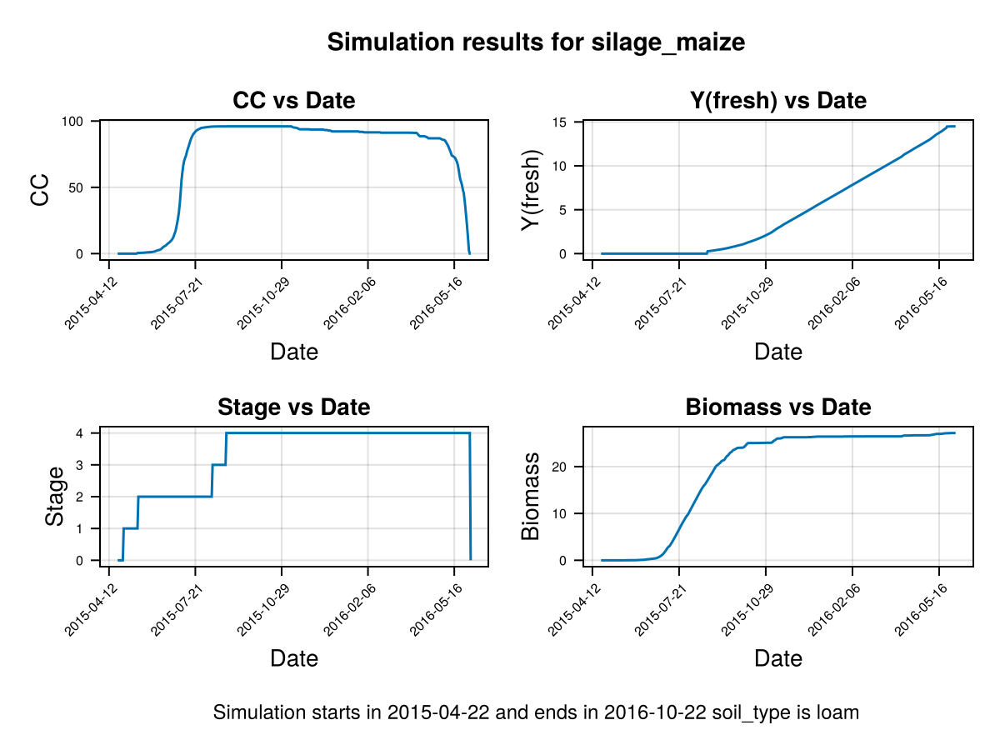

In [8]:
# plot the results
CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type)

we can pass information about some crop parameters using a dictionary like this:


SIMULATION WENT WELL

Data planting density 117000
Crop's planting density 117000



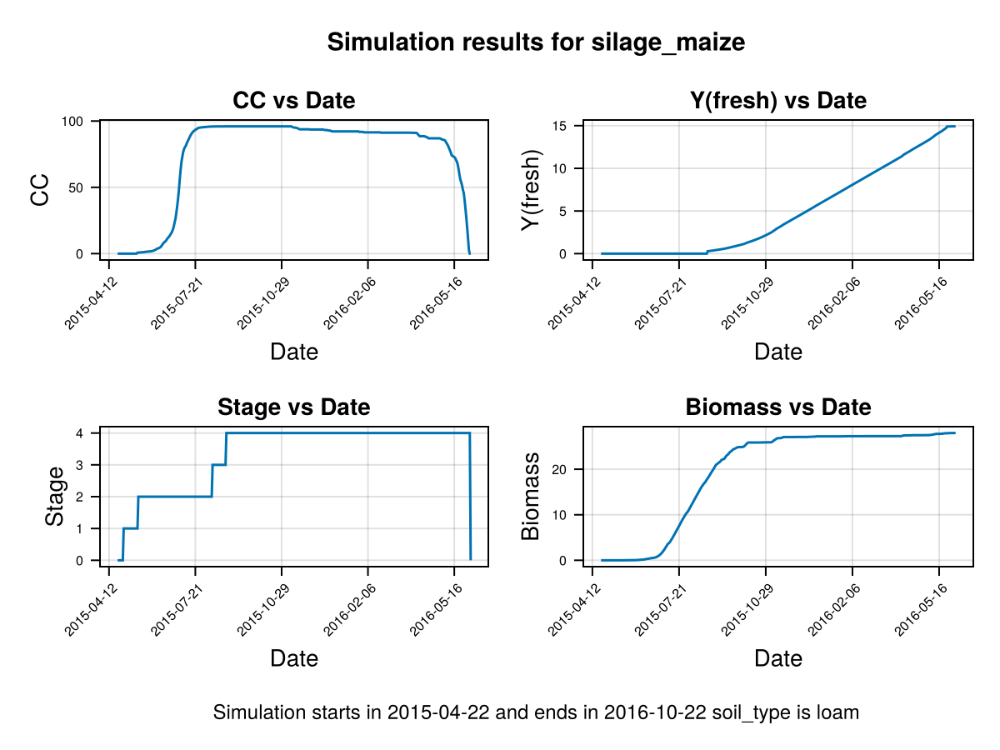

In [9]:
# get the planting density for the given crop_type
plantingdens = filter(row -> row.crop_type==crop_type, general_crop_data_df)[1,:plantingdens];

# create a kw tuple with the additional information that we wish to pass to AquaCrop
crop_dict = Dict{String,Any}("PlantingDens" => plantingdens);
kw = (
        crop_dict = crop_dict,
     );

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

println("Data planting density ", plantingdens)
println("Crop's planting density ", cropfield.crop.PlantingDens)
println("")

# plot the results
CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type)

## Step by step Crop Calibration

In `AquaCrop.jl` there are lot's of parameters that control the crop's growth, they need to be calibrated following the models causality.
For our specific case we will assume the following:
1. The climate data is complete.
1. The soil is well characterized.
1. We have field phenology, biomass and yield data, and was collected correctly.   

And follow these steps for the calibration:
1. Crop stages using phenology data.
1. Soil-root and Canopy cover behaviour.
1. Biomass.
1. Yield.

### Crop Phenology Stages calibration

To do this we will use the phenology field data from [1], where we have dates of several crop phases. Some of these phases are related to AquaCrop's parameters, with these dates and the climate data we can find better values of the Growing Degree Days until each stage of the crop.

The minimal data for this is:
1. Phenology dates recorded from field.
1. Climate data.
1. Crop's minimal and maximal temperature of development.

The phenology phases that we are interested when calibrating the crop's stages are:
1. Crop's emergence, with the days from sowing to emergence we can calibrate AquaCrop's`GDDaysToGermination` parameter.
1. Crop's begin of flowering, with the days from sowing to begin of flowering we can calibrate AquaCrop's `GDDaysToFlowering` parameter.
1. Crop's end of flowering, with the days from sowing to end of flowering we can calibrate AquaCrop's `GDDaysLengthlowering` parameter.
1. Crop's harvest, with the days from sowing to harvest we can calibrate AquaCrop's `GDDaysToHarvest` parameter.

Additionaly some other phenology phases important for AquaCrop are:
1. Crop's 90% Canopy cover, with the days from sowing to 90% canopy cover we can calibrate `GDDaysToFullCanopy`.
1. Crop's senescence, with the days from sowing to senescence we can calibrate to set `GDDaysToSenescence`.
1. Crop's max rooting, with the days from sowing to max rooting we can calibrate `GDDaysToMaxRooting`.
In case we are missing this data we can estimate the parameters in a different way.

In [10]:
# process phenology raw data phases
sowing_phase = 10; # sowing phase id
harvest_phase = 39; # harvest phase id for silage maize
maize_phenology_processed_df = CropGrowthTutorial.process_crop_phenology(maize_phenology_raw_df, sowing_phase, harvest_phase)

Row,beginfloweringdate,daystoharvest,emergencedate,endfloweringdate,harvestdate,sowingdate,stations_id,year
,Date?,Int64,Date?,Date?,Date,Date,Int64,Int64
1,2015-07-17,124,2015-05-12,missing,2015-08-31,2015-04-29,15460,2015
2,2016-07-16,124,2016-05-13,missing,2016-08-31,2016-04-29,15460,2016
3,2017-07-13,124,2017-05-17,missing,2017-09-06,2017-05-05,15460,2017
4,2018-07-07,105,2018-05-10,missing,2018-08-10,2018-04-27,15460,2018
5,2019-07-17,114,2019-05-21,missing,2019-08-28,2019-05-06,15460,2019
6,2020-07-13,116,2020-05-19,missing,2020-08-29,2020-05-05,15460,2020
7,2021-07-22,122,2021-05-20,missing,2021-09-05,2021-05-06,15460,2021
8,2022-07-19,98,2022-05-16,missing,2022-08-15,2022-05-09,15460,2022


In [11]:
# get the days and growing degree days for each phenology phase from the actual data
maize_phenology_actual_df = CropGrowthTutorial.process_crop_phenology_actual_gdd(crop_name, maize_phenology_processed_df, uhk_clim_df)

Row,sowingdate,harvestdate,year,harvest_actualdays,harvest_actualgdd,beginflowering_actualdays,beginflowering_actualgdd,endflowering_actualdays,endflowering_actualgdd,emergence_actualdays,emergence_actualgdd
,Date,Date,Int64,Int64?,Float64?,Int64?,Float64?,Int64?,Float64?,Int64?,Float64?
1,2015-04-29,2015-08-31,2015,124,1142.2,79,604.7,missing,missing,13,68.75
2,2016-04-29,2016-08-31,2016,124,1159.9,78,638.95,missing,missing,14,64.1
3,2017-05-05,2017-09-06,2017,124,1211.9,69,648.1,missing,missing,12,64.75
4,2018-04-27,2018-08-10,2018,105,1104.05,71,647.2,missing,missing,13,67.55
5,2019-05-06,2019-08-28,2019,114,1113.4,72,599.0,missing,missing,15,43.8
6,2020-05-05,2020-08-29,2020,116,1084.8,69,530.2,missing,missing,14,45.45
7,2021-05-06,2021-09-05,2021,122,1140.4,77,702.95,missing,missing,14,73.6
8,2022-05-09,2022-08-15,2022,98,1026.85,71,688.4,missing,missing,7,61.15


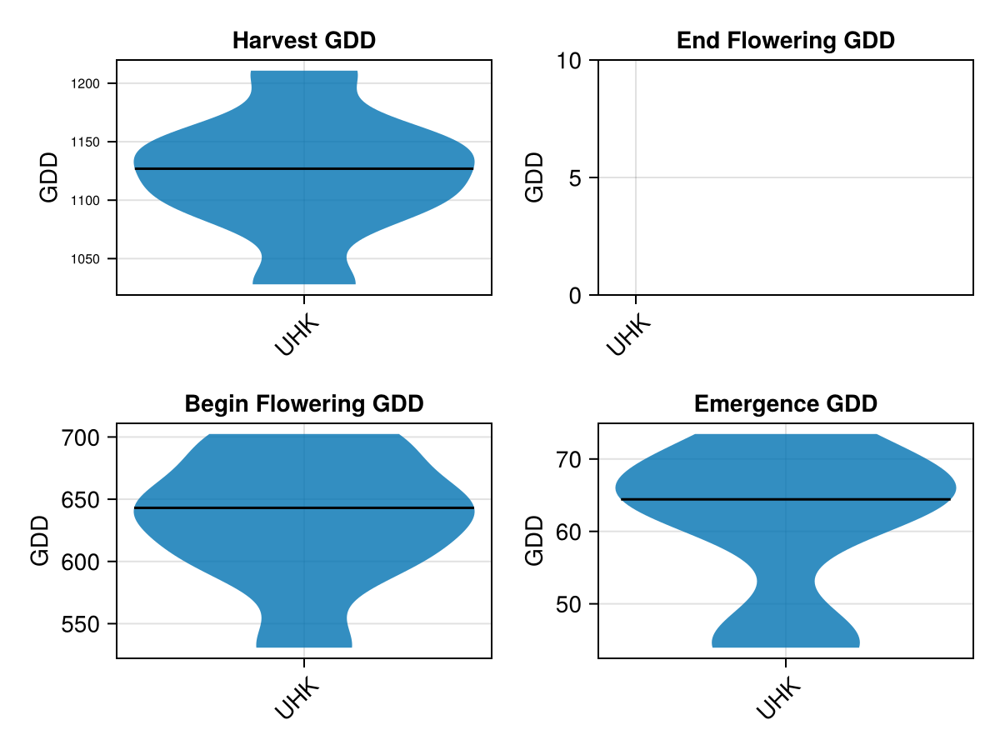

In [12]:
# plot the distribution of gddays until the phenology phase from the actual data
CropGrowthTutorial.plot_GDD_stats_violin(maize_phenology_actual_df, "UHK")

In [13]:
# get the days and growing degree days for each phenology phase from the simulated data
maize_phenology_simulated_df = CropGrowthTutorial.process_crop_phenology_simulated_gdd(crop_name, maize_phenology_processed_df, uhk_clim_df)

Row,sowingdate,harvest_simulateddays,harvest_simulatedgdd,beginflowering_simulateddays,beginflowering_simulatedgdd,endflowering_simulateddays,endflowering_simulatedgdd,emergence_simulateddays,emergence_simulatedgdd
,Date,Int64?,Float64?,Int64?,Float64?,Int64?,Float64?,Int64?,Float64?
1,2015-04-29,400,1694.95,102,883.65,117,1060.15,16,80.8
2,2016-04-29,391,1702.3,97,877.35,116,1063.7,20,80.25
3,2017-05-05,371,1699.4,89,874.25,106,1057.5,13,77.35
4,2018-04-27,357,1700.3,90,878.6,102,1059.6,15,83.9
5,2019-05-06,388,1701.35,94,882.0,110,1055.15,21,77.5
6,2020-05-05,398,1699.15,99,875.75,114,1064.4,20,78.55
7,2021-05-06,394,1698.65,93,878.7,112,1063.3,15,81.25
8,2022-05-09,364,1700.95,86,879.7,100,1055.55,9,84.0


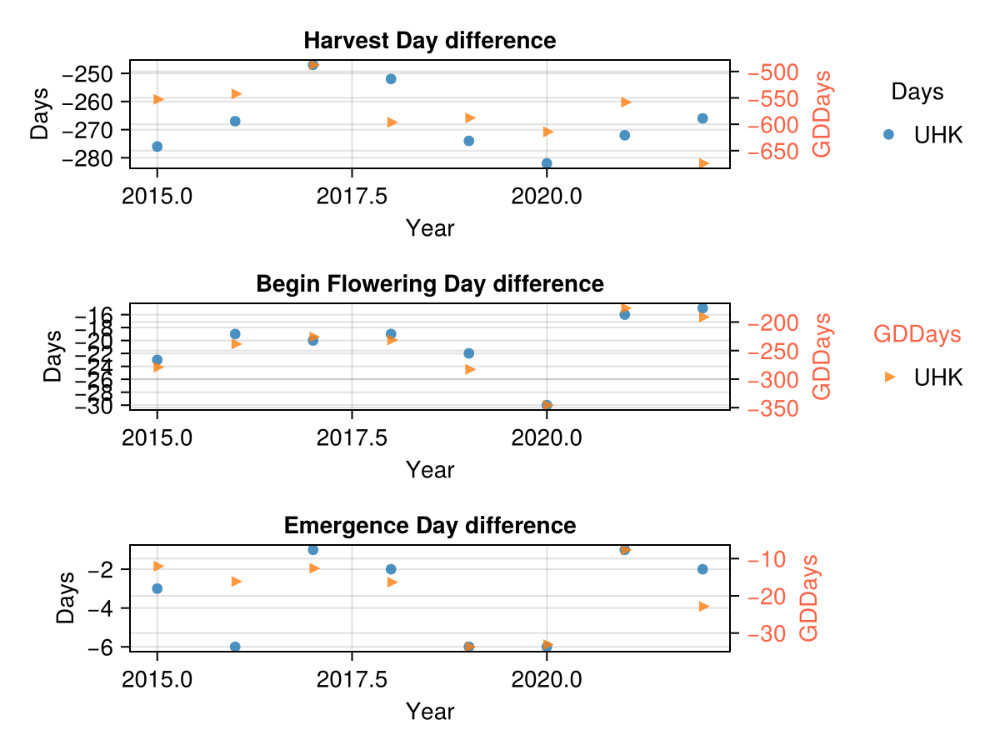

In [14]:
# compare the day difference between the actual data and the simulated data
maize_phenology_df = leftjoin(maize_phenology_actual_df, maize_phenology_simulated_df; on=:sowingdate);
CropGrowthTutorial.plot_GDD_stats_years(maize_phenology_df, "UHK")

In the last figure we use the default AquaCrop parameters for the phenology phases. We see that the actual phase happens long before the simulated phase, specially for harvest.

In order to calibrate the crop stages with the actual data we will use a simple heuristic, we will set the crop's parameters equal to the median of the actual observed stage (in case we do not have a median value we use the default value from AquaCrop).

In [15]:
# get a statistical distribution of the actual gdd data
describe(maize_phenology_actual_df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Any,Any,Int64,Type
1,sowingdate,,2015-04-29,2018-10-31,2022-05-09,0,Date
2,harvestdate,,2015-08-31,,2022-08-15,0,Date
3,year,2018.5,2015,2018.5,2022,0,Int64
4,harvest_actualdays,115.875,98,119.0,124,0,"Union{Missing, Int64}"
5,harvest_actualgdd,1122.94,1026.85,1126.9,1211.9,0,"Union{Missing, Float64}"
6,beginflowering_actualdays,73.25,69,71.5,79,0,"Union{Missing, Int64}"
7,beginflowering_actualgdd,632.438,530.2,643.075,702.95,0,"Union{Missing, Float64}"
8,endflowering_actualdays,NaN,,,,8,"Union{Missing, Int64}"
9,endflowering_actualgdd,NaN,,,,8,"Union{Missing, Float64}"


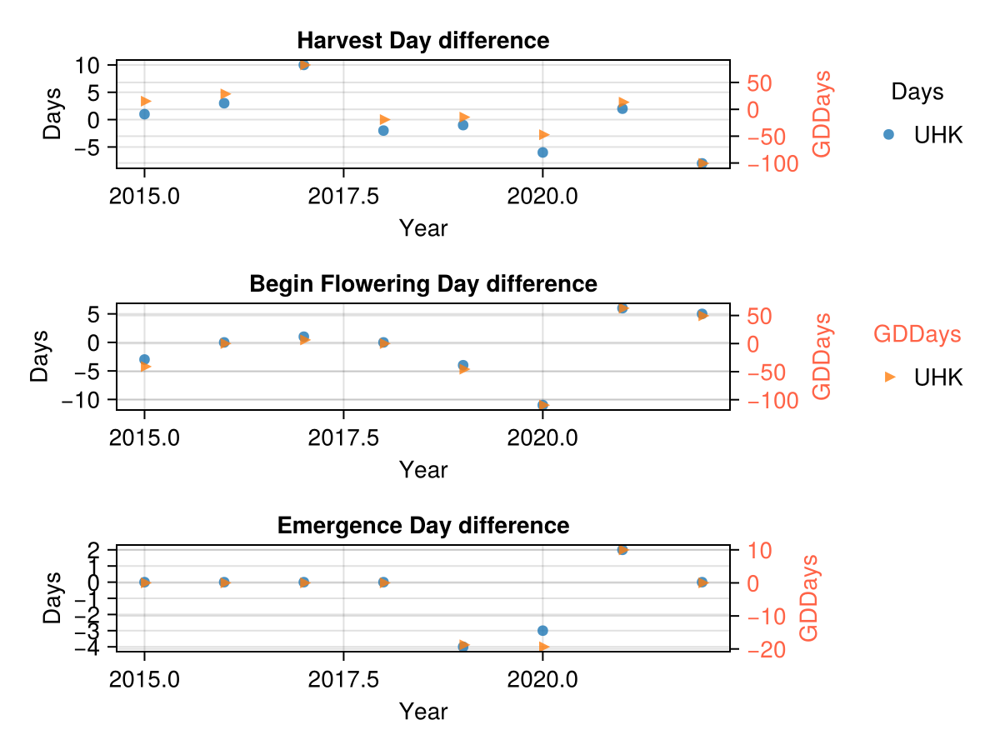

In [16]:
# create a kw tuple with the additional information that we wish to pass to AquaCrop
# consider the median of the actual gdd distribution for each phenology phase
crop_dict = merge(crop_dict, Dict(
            "GDDaysToHarvest" => 1127, # harvest actual median
            "GDDaysToFlowering" => 643, # beginflowering actual median
            "GDDaysToGermination" => 64, # emergence actual median
            "GDDLengthFlowering" => 180 # default value of aquacrop since we do not have endflowering
        ));
kw = (
        crop_dict = crop_dict,
     );

# get the days and growing degree days for each phenology phase from the simulated data using the additional information
maize_phenology_simulated_df = CropGrowthTutorial.process_crop_phenology_simulated_gdd(crop_name, maize_phenology_df, uhk_clim_df; kw...)

# compare the day difference between the actual data and the simulated data
maize_phenology_df = leftjoin(maize_phenology_actual_df, maize_phenology_simulated_df; on=:sowingdate);
CropGrowthTutorial.plot_GDD_stats_years(maize_phenology_df, "UHK")

In the last figure we use the calibrated parameters for the phenology phases. We see that the actual phase and the simulated phase are not far away.

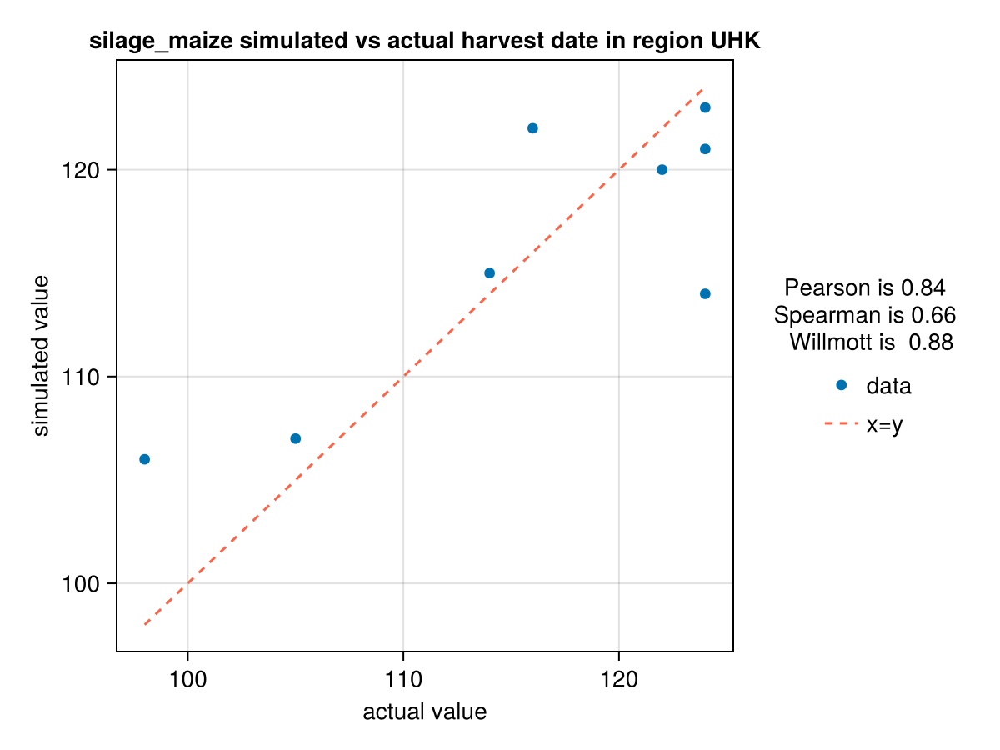

In [17]:
CropGrowthTutorial.plot_correlation(maize_phenology_df[:,:harvest_actualdays], maize_phenology_df[:,:harvest_simulateddays], crop_type, "UHK", "harvest date")

### Soil-root and Canopy Cover

Once we have calibrated the crop stages, we can calibrate the parameters that control the canopy growth, canopy decay and root growth.

#### Canopy Cover

To calibrate the canopy cover we will see the qualitative behaviour of or sim


SIMULATION WENT WELL



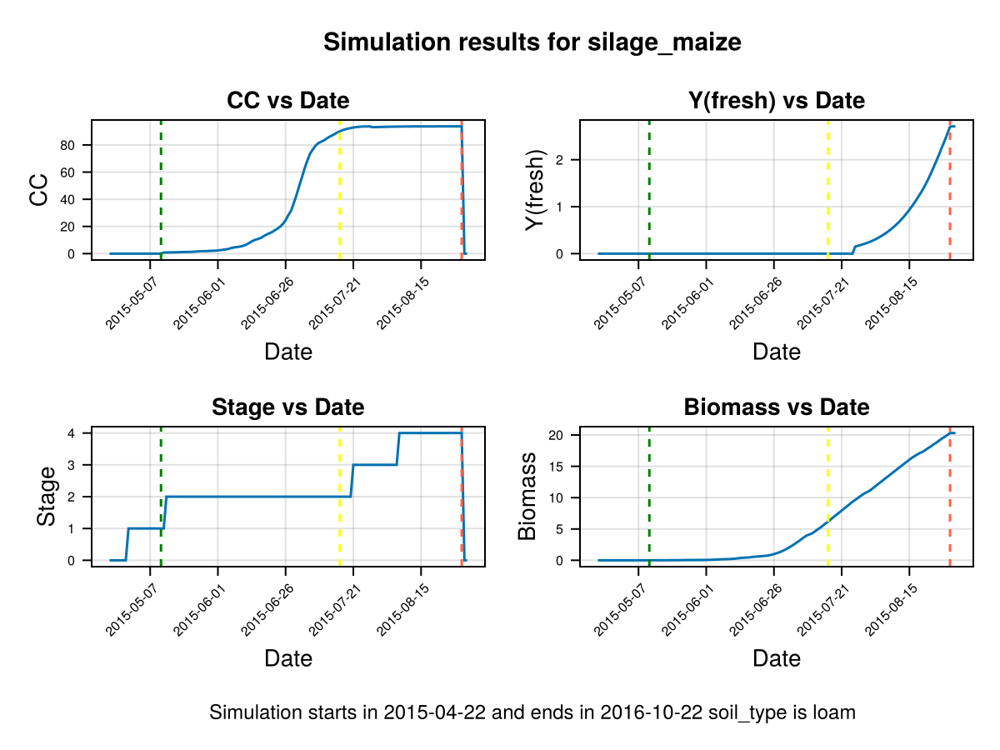

In [18]:
# use the parameters that we have calibrated until now
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# send information about the actual phenology dates to the plot function
kw_plot = (
        end_day = maize_phenology_processed_df[i,:harvestdate] - Date("0001-01-01"),
        emergence_day = maize_phenology_processed_df[i,:emergencedate] - Date("0001-01-01"),
        beginflowering_day = maize_phenology_processed_df[i,:beginfloweringdate] - Date("0001-01-01"),
        endflowering_day = maize_phenology_processed_df[i,:endfloweringdate] - Date("0001-01-01"),
)

# plot the results
CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...)

In last figure we show that the simulated crop stages go in hand with the actual recorded phenolgy stages (dashed lines). Nevertheless, the Canopy Cover grows slowly and decays abruptly on the harvest date, to calibrate this behaviours we do the following:

1. Canopy Growth: This is influenced by the crop parameters `GDDaysToFullCanopy` and `GDDCGC` (Canopy Growth Coefficient per Growing Degree Day). We adjust `GDDaysToFullCanopy` using the calibrated values of `GDDaysToHarvest` and `GDDaysToFlowering` (see the function `CropGrowthTutorial.proportional_adjust`). The idea is that these helper parameters reflect the overall pace of the crop's development, so we scale the target parameter (`GDDaysToFullCanopy`) in proportion to their changes. This way, the adjustment stays consistent with the crop's developmental timeline. The Canopy Growth Coefficient (`GDDCGC`) is calibrated using the time to full canopy, the maximum canopy cover, and AquaCrop’s canopy growth formula (see `CropGrowthTutorial.cgc_adjust`).
1. Canopy Decay: It is controlled by the crop's parameters `GDDaysToSenescence`, `GDDaysToHarvest` and `GDDCDC` (Canopy Decay Coefficient per Growing Degree Day). We calibrate `GDDaysToSenescence` with the same idea behind the calibration of `GDDaysToFullCanopy` in last paragraph. The Canopy Decay Coefficient (`GDDCDC`) is calibrated similarly to `GDDCGC`, considering the canopy decay process from we use AquaCrop's formula (see `CropGrowthTutorial.cdc_adjust`).


SIMULATION WENT WELL



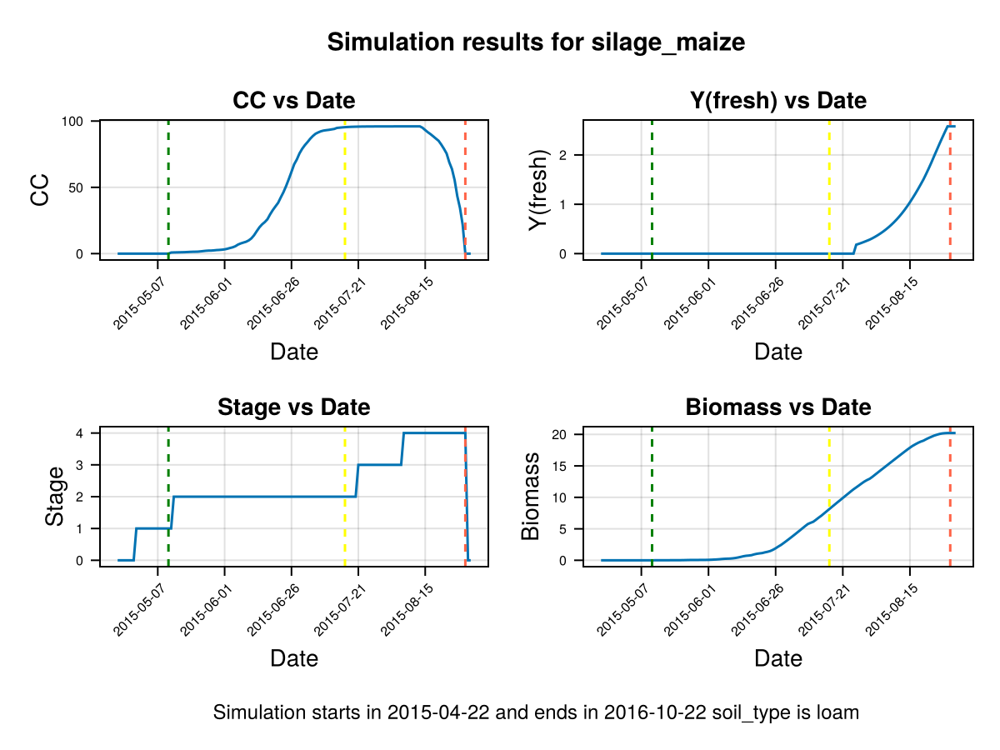

In [19]:
# add the canopy growth and decay calibrated parameters
crop_dict = merge(crop_dict, Dict(
            "GDDaysToSenescence"  => 950,  # proportional_adjust with default value of this parameter and the new flowering and harvest times
            "GDDCDC"              => 0.0167875, # adjusted using new senescence and harvest times
            "GDDaysToFullCanopy"  => 519,  # proportional_adjust with default value of this parameter and the new flowering and harvest times
            "GDDCGC"              => 0.0161843, # adjusted using new time to full canopy
        ));

# use the parameters that we have calibrated until now
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# send information about the actual phenology dates to the plot function
kw_plot = (
        end_day = maize_phenology_processed_df[i,:harvestdate] - Date("0001-01-01"),
        emergence_day = maize_phenology_processed_df[i,:emergencedate] - Date("0001-01-01"),
        beginflowering_day = maize_phenology_processed_df[i,:beginfloweringdate] - Date("0001-01-01"),
        endflowering_day = maize_phenology_processed_df[i,:endfloweringdate] - Date("0001-01-01"),
)

# plot the results
CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...)

Note that in last figure the full canopy cover happens before flowering, and the canopy decay goes slowly from senescence to harvest. It is important to note that a further calibration on `GDDCGC` and `GDDCDC` can be done if we have more data about the canopy cover over the dates, or the final biomass. If we have phenological data about the dates of senescence and canopy cover we can calibrate `GDDaysToSenescence` and `GDDaysToFullCanopy`.

 

#### Root expansion

Now we focus on the root growth, to do this we will analyze the root zone expansion and the water content on it.


SIMULATION WENT WELL



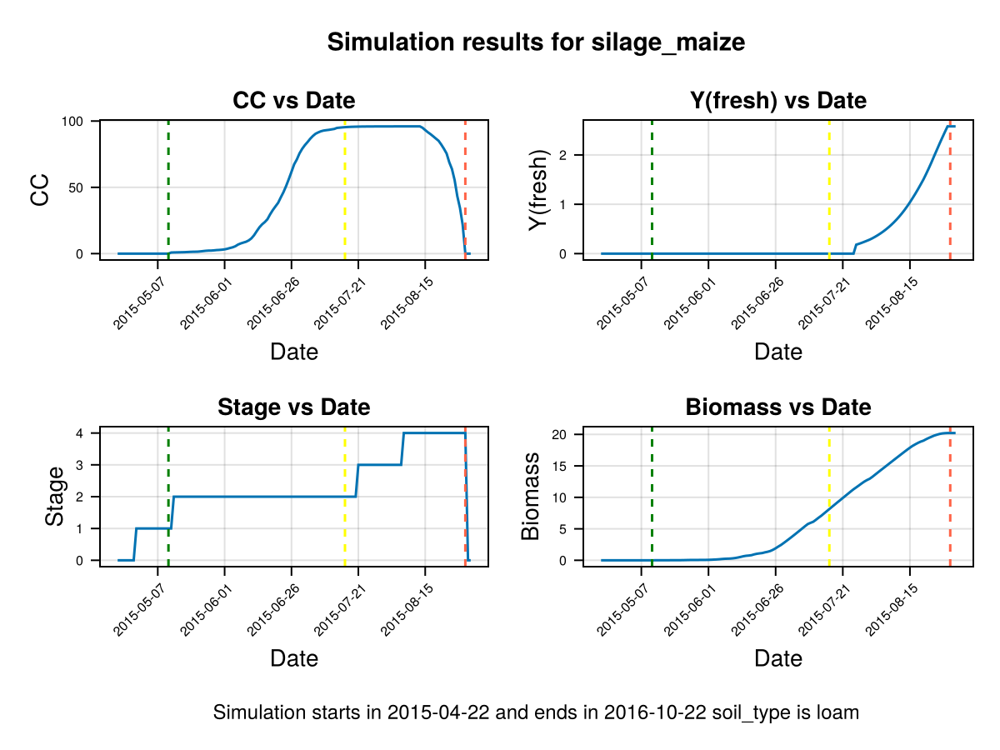

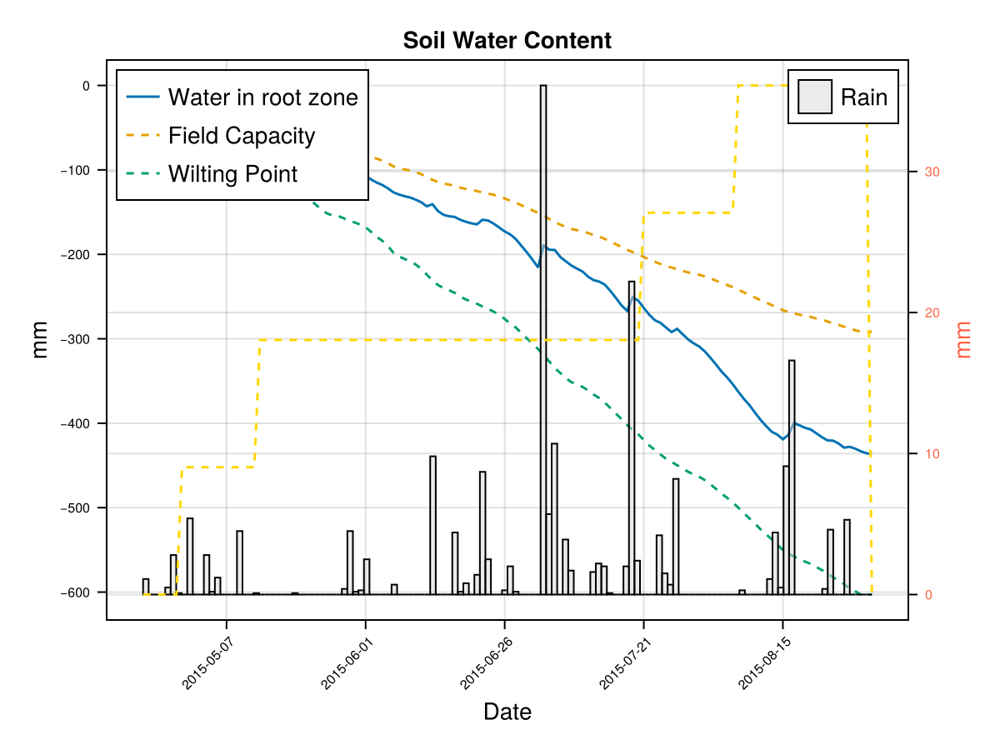

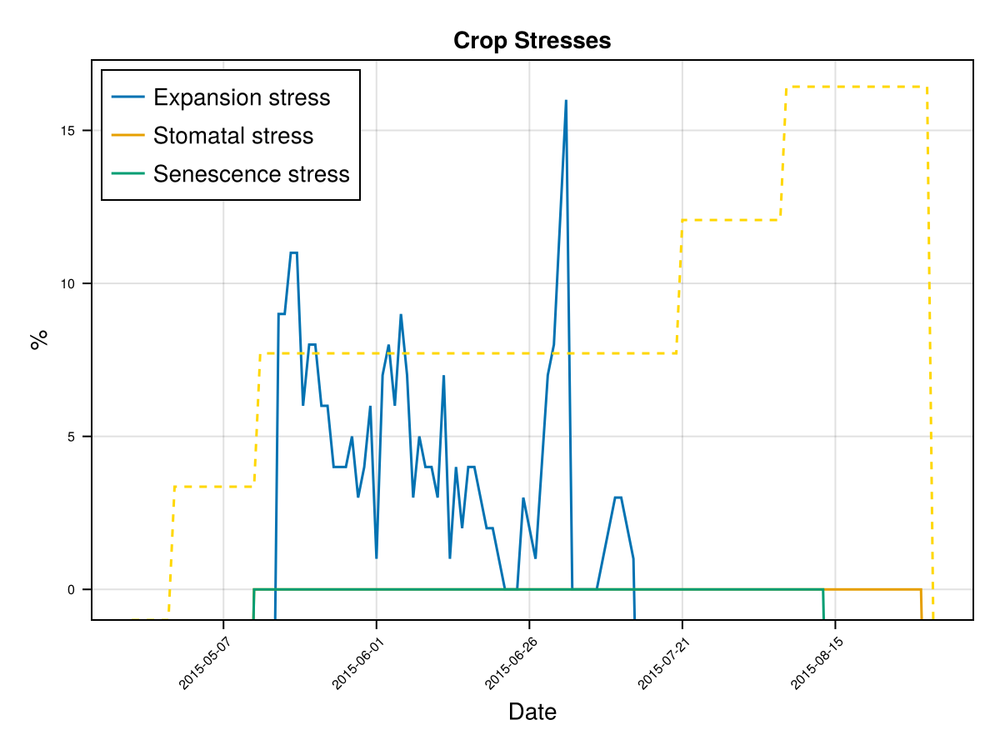

CairoMakie.Screen{IMAGE}


In [20]:
# Using calibration up to now
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))

The previous figures show the soil water content in the root zone and the water-related stresses experienced by the crop. We can see that the root zone keeps expanding until the crop reaches the end of its life cycle, and that the crop doesn't suffer from significant water stress—whether due to lack or excess of water.

To calibrate how the root zone grows, we focus on two key parameters:

Time to Maximum Rooting (`GDDaysToMaxRooting`) – This represents how long it takes for the roots to reach their maximum depth. We adjust this parameter in proportion to the crop's overall development timeline, similar to how we adjust `GDDaysToFullCanopy`.
Maximum Effective Rooting Depth (`RootMax`) – This defines how deep the roots can go. We calibrate this value by observing the crop's water stress patterns: if the root zone is too shallow or too deep, it can lead to water deficits or excesses that cause premature canopy decline—something that doesn’t match the experimental behavior of our crop.
The following figures show how changing `RootMax` affects the crop’s access to water and its stress levels.
 


SIMULATION WENT WELL



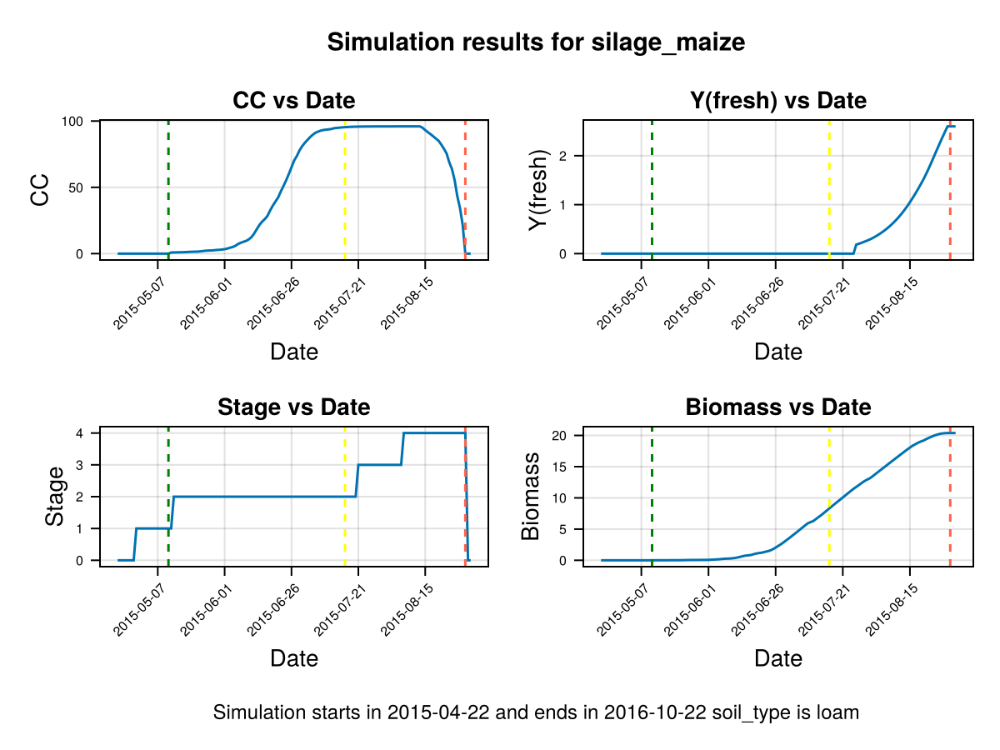

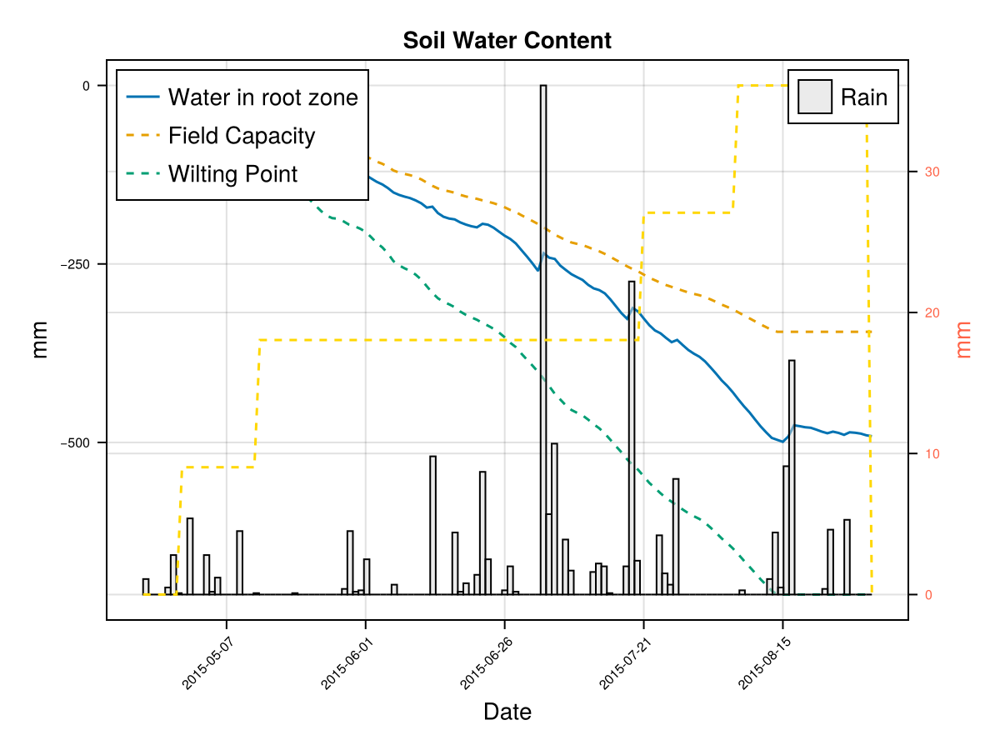

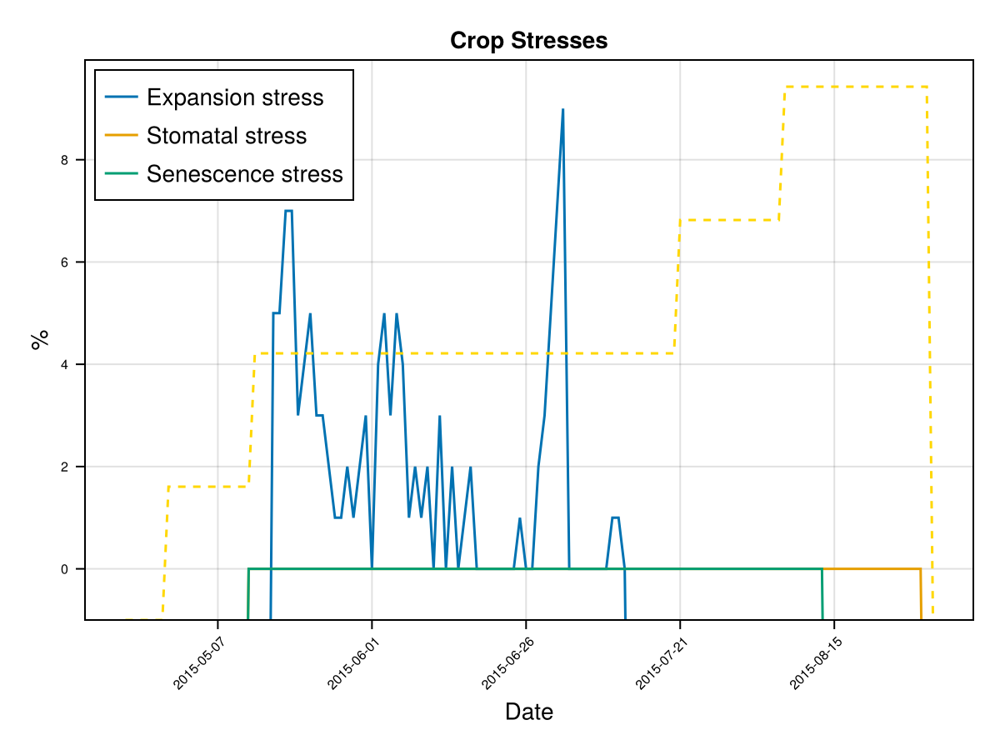

CairoMakie.Screen{IMAGE}


In [21]:
# use the calibration of time to max rooting
crop_dict = merge(crop_dict, Dict(
            "GDDaysToMaxRooting"  => 955 # proportional_adjust with default value of this parameter and the new flowering and harvest times
        ));
kw = (
        crop_dict = crop_dict,
     );

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield)) 

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))

In last figures we see the root stops growing before the end of crop cycle


SIMULATION WENT WELL



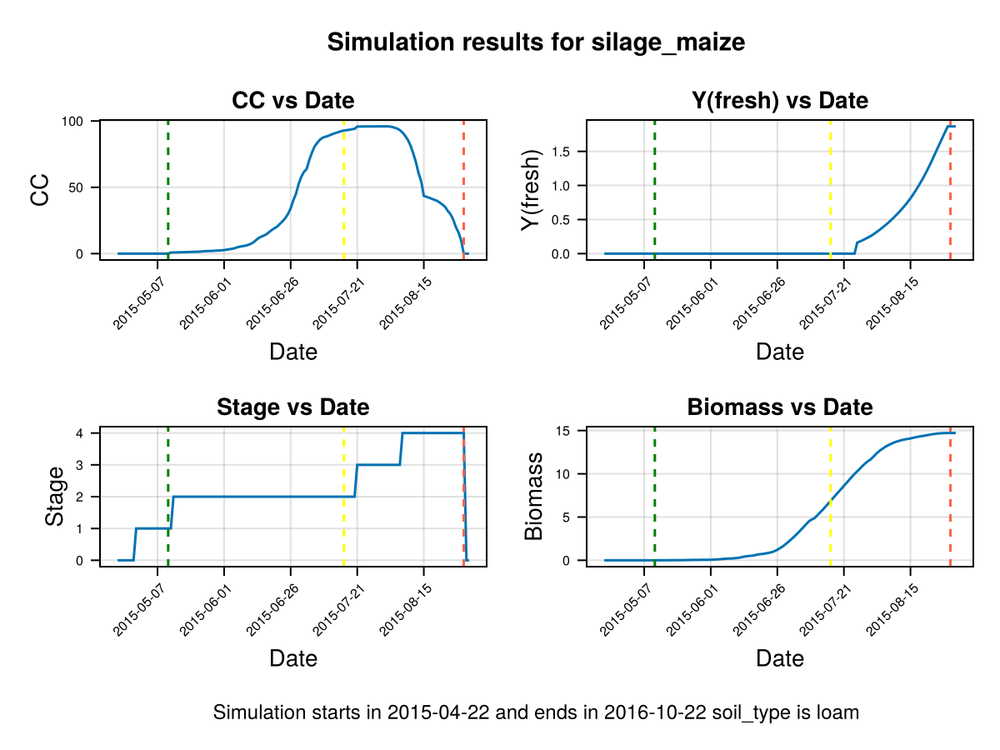

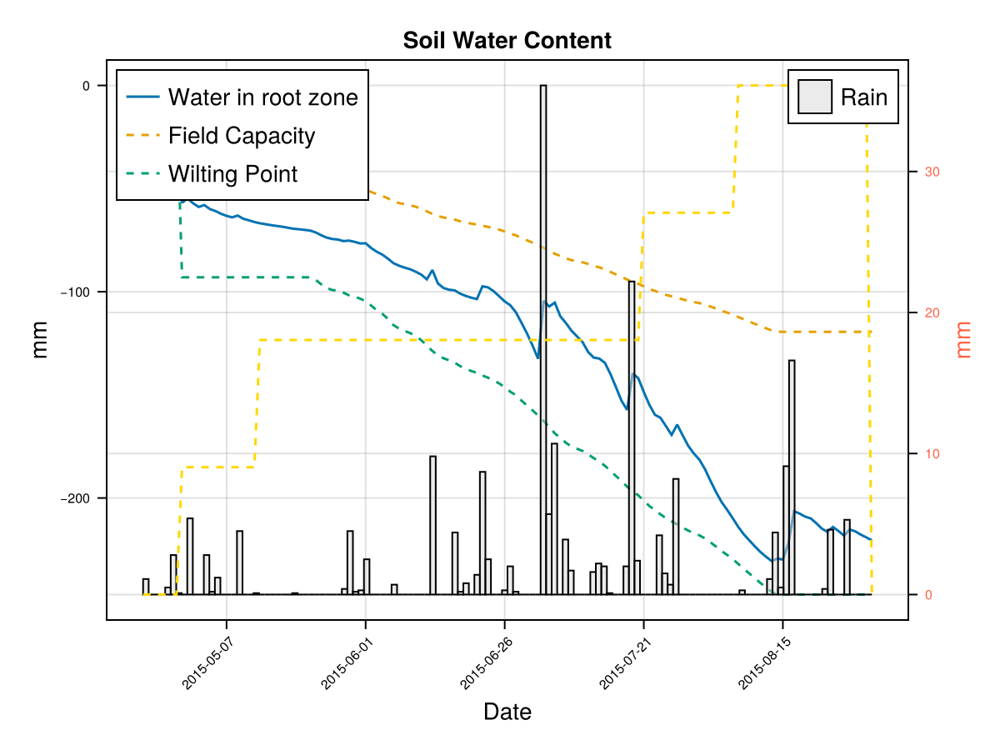

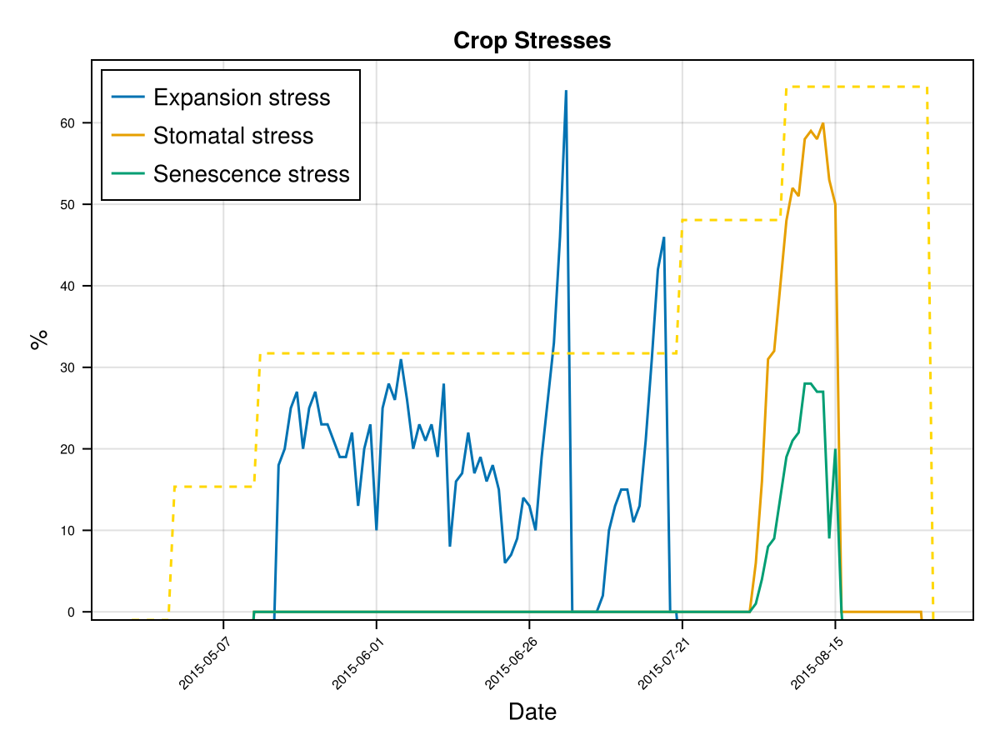

CairoMakie.Screen{IMAGE}


In [22]:
# shallow root
crop_dict["RootMax"] = 0.8; # default 2.3 - 1.5
kw = (
        crop_dict = crop_dict,
     );
# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))

In last figures we see that a shallow root leaves to a water deficit and triggers early senscence.


SIMULATION WENT WELL



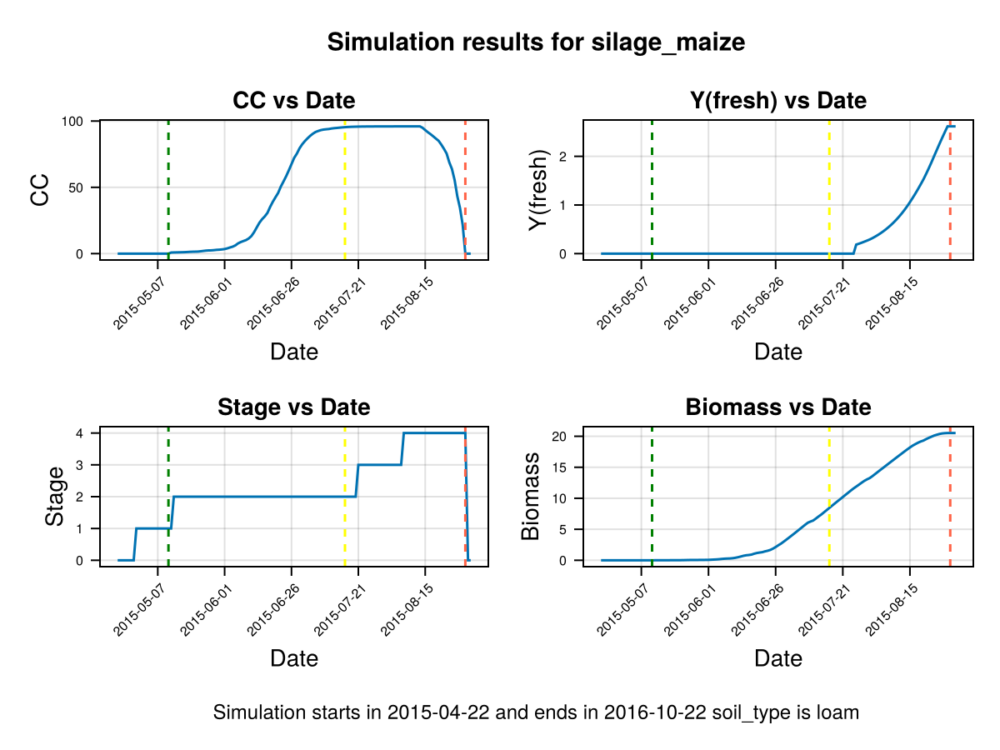

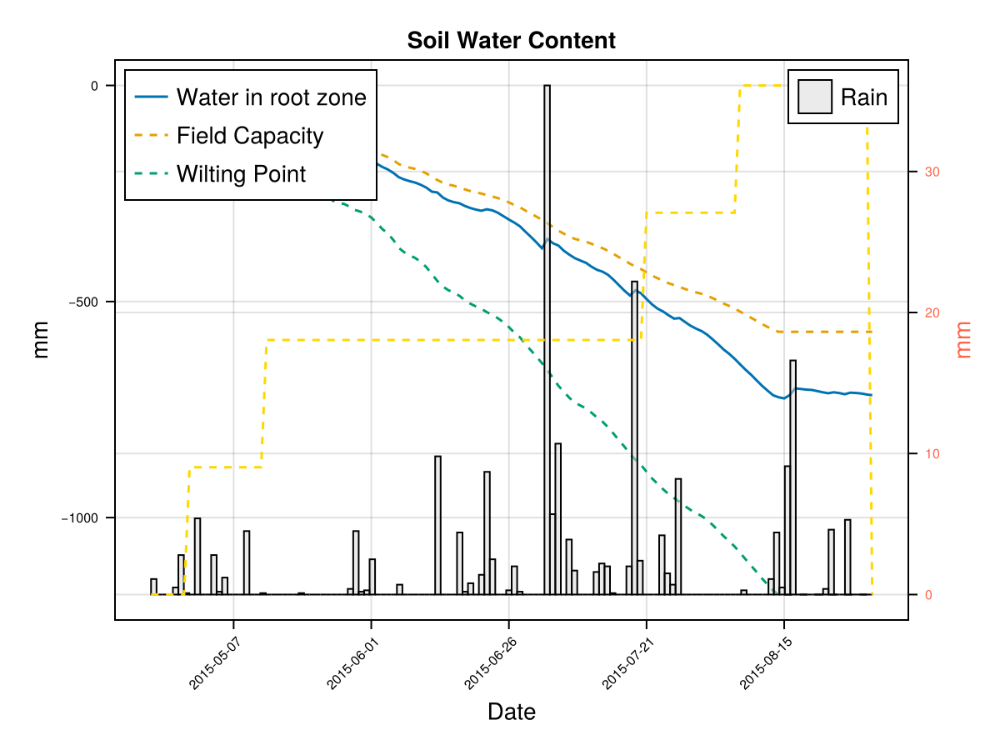

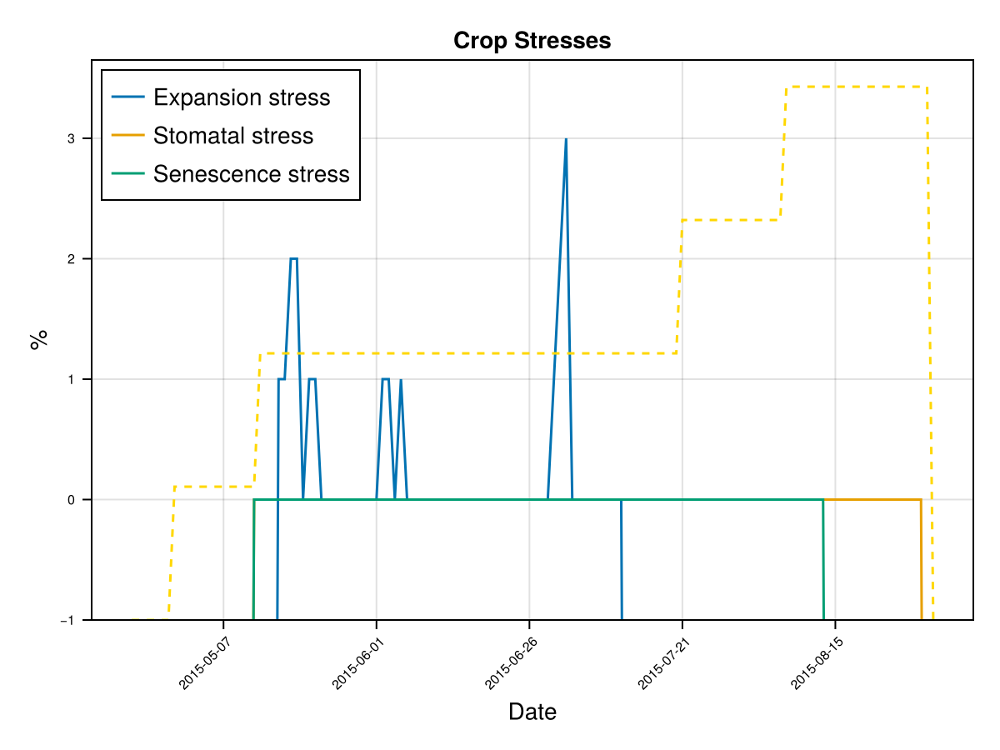

CairoMakie.Screen{IMAGE}


In [23]:
# deep root
crop_dict["RootMax"] = 3.8; # default 2.3 + 1.5
kw = (
        crop_dict = crop_dict,
     );
# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))

In last figure we see that a deep root leaves to less water stresses on this soil type, but it may be that in some other soils this causes an excess of water. 

In the following figures we choose two root sizes and change the soil type to "clay"


SIMULATION WENT WELL



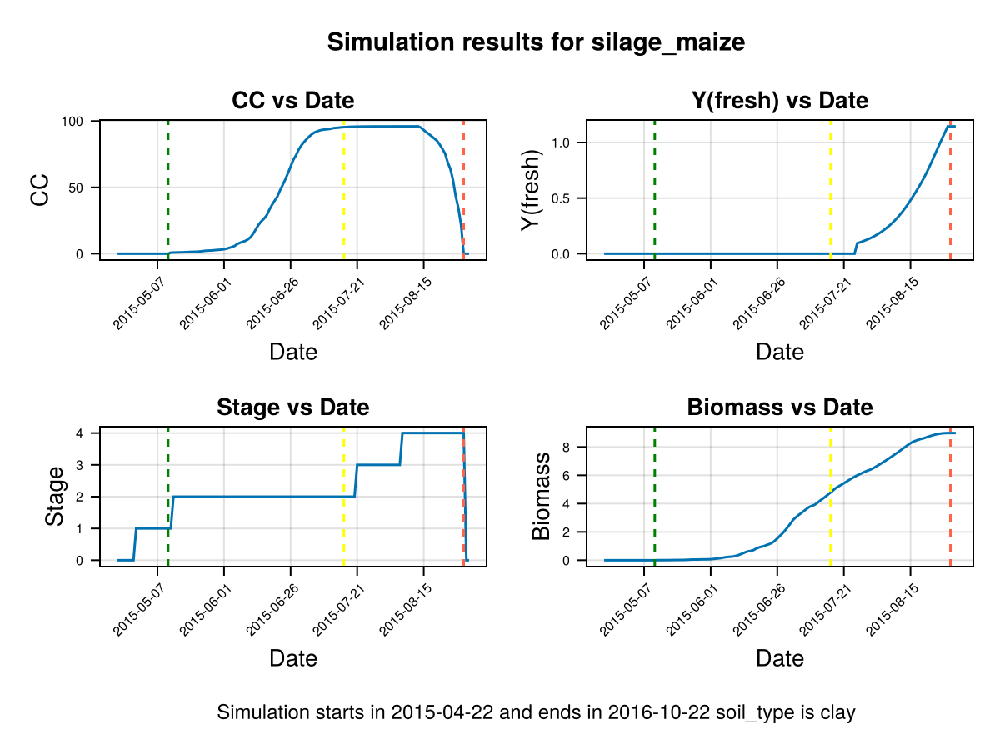

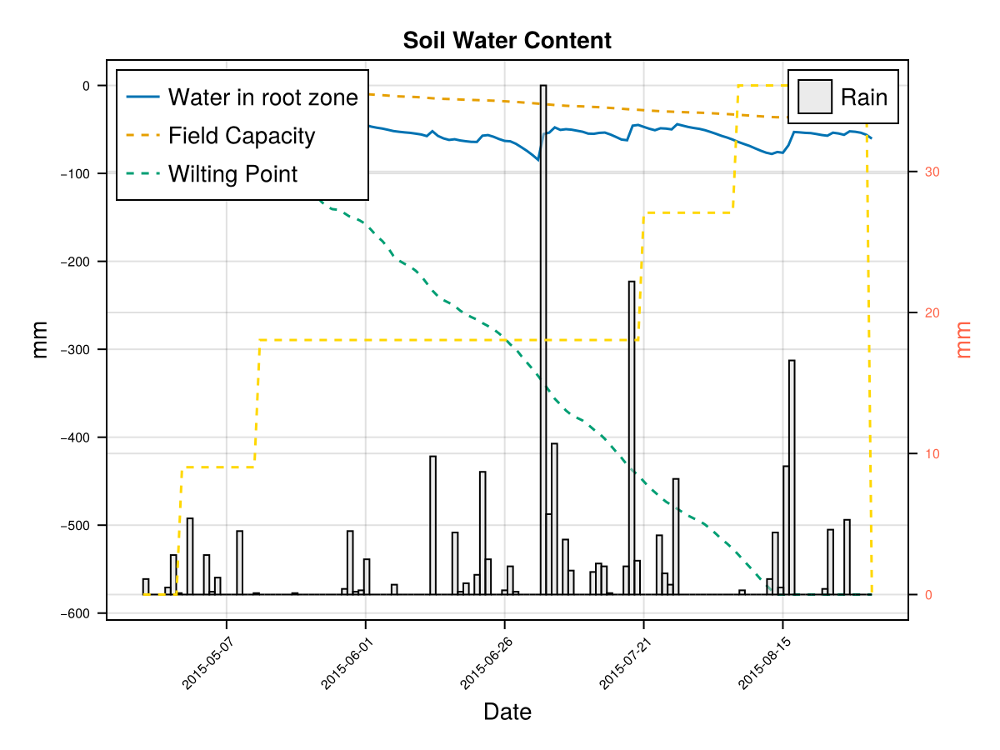

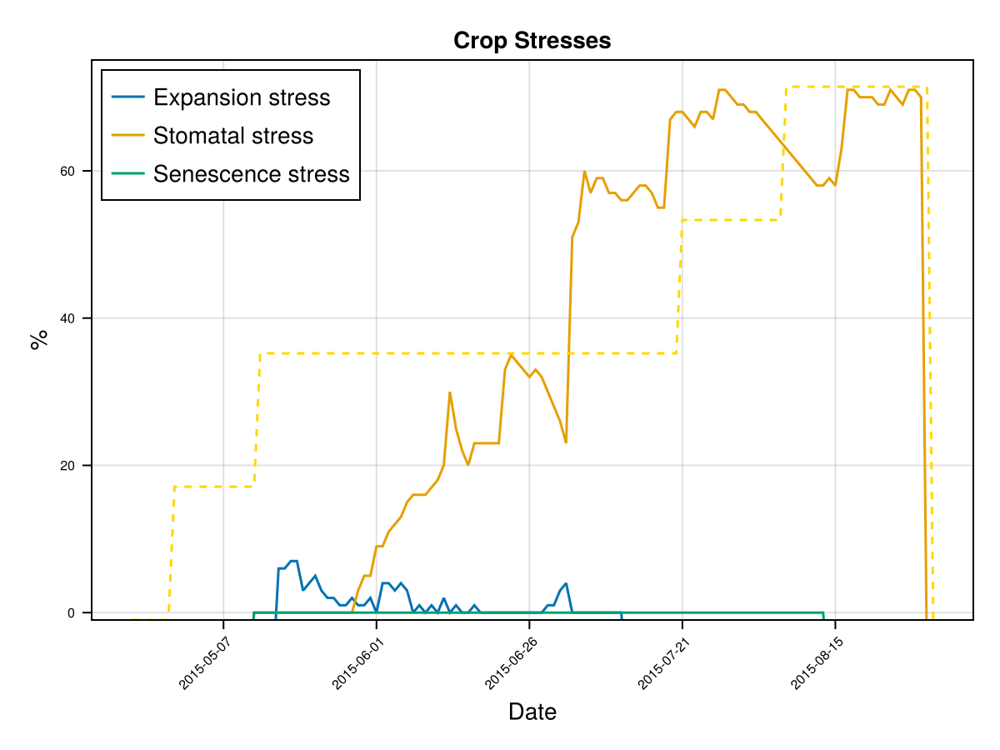

CairoMakie.Screen{IMAGE}


In [24]:
# deep root on soil_type = clay
crop_dict["RootMax"] = 3.8; # default 2.3 + 1.5
kw = (
        crop_dict = crop_dict,
     );
# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation("clay", crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, "clay"; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))


SIMULATION WENT WELL



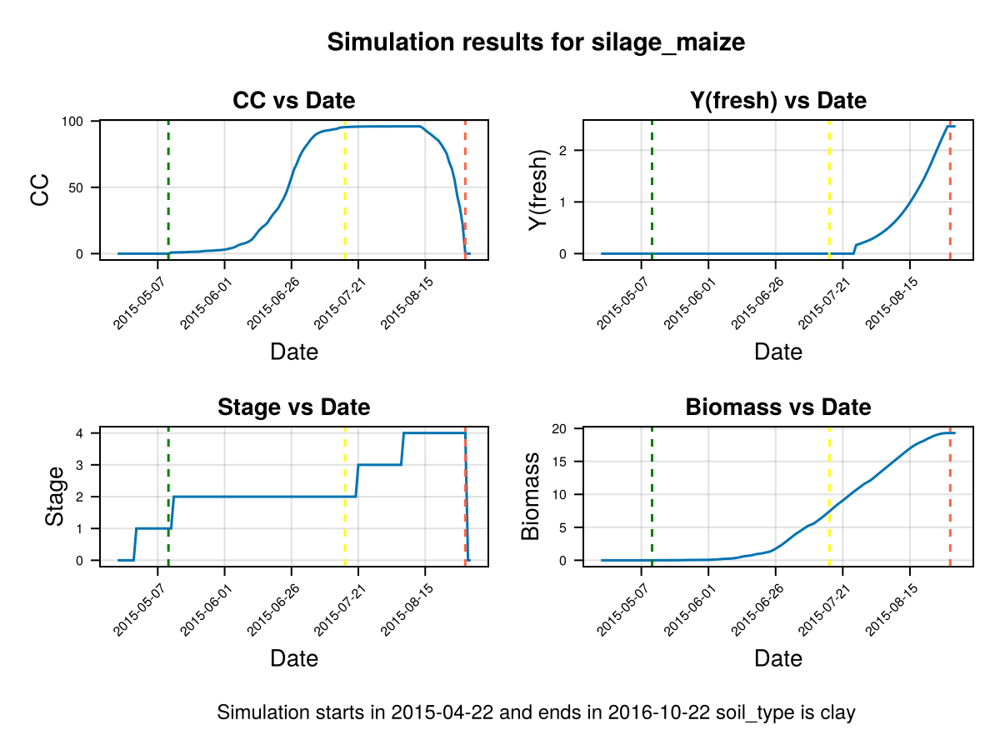

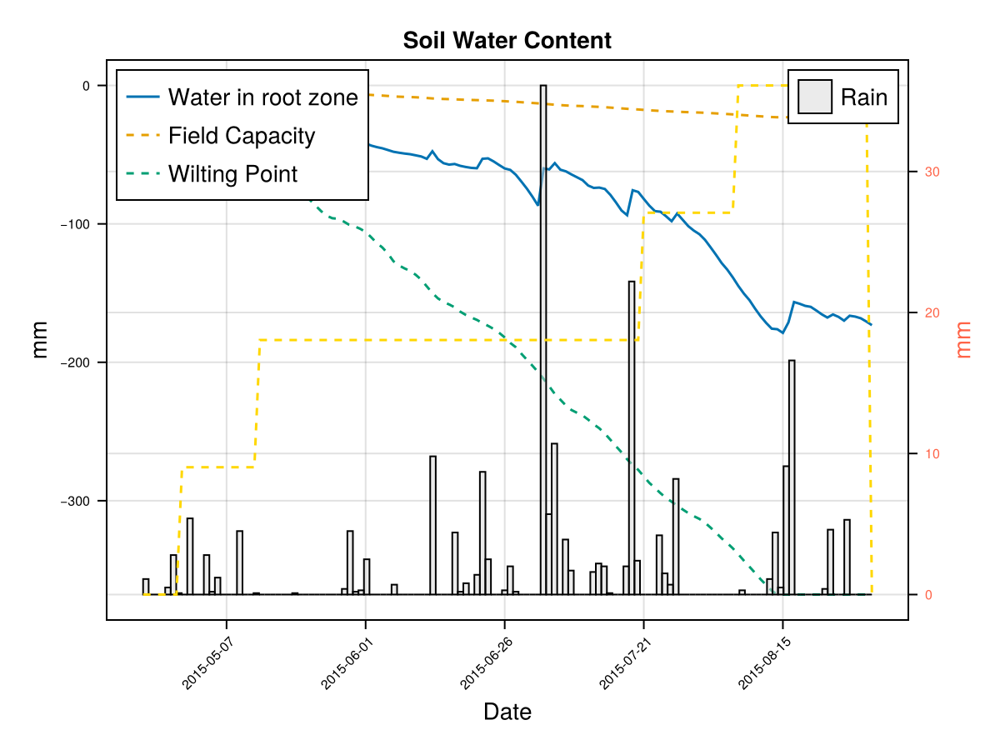

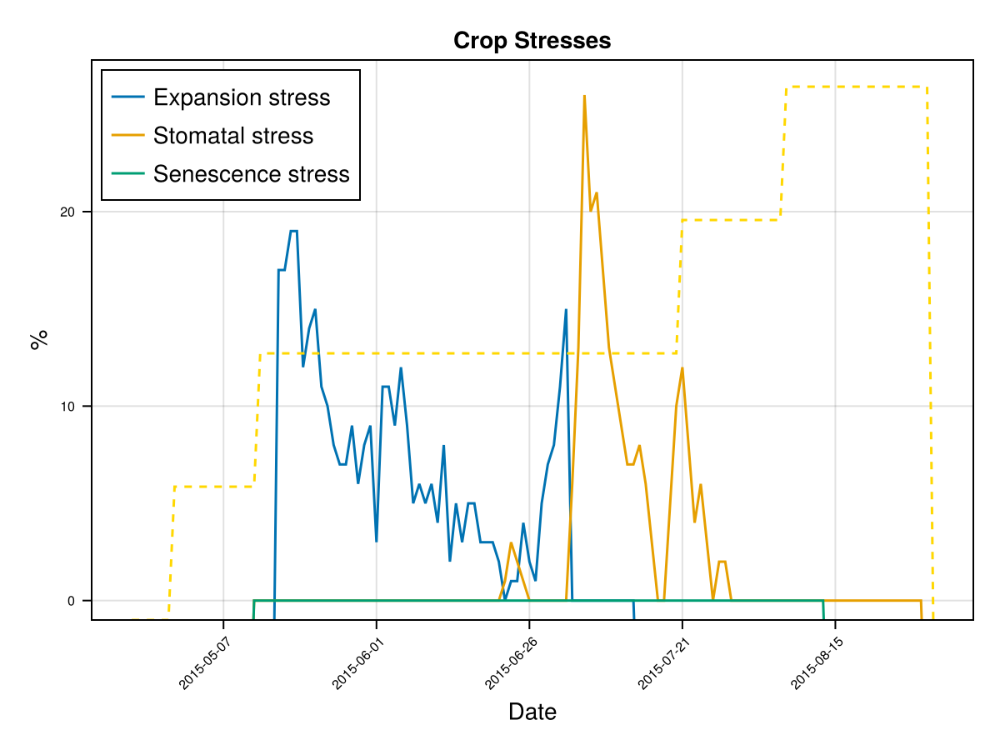

CairoMakie.Screen{IMAGE}


In [25]:
# default root on soil_type = clay
crop_dict["RootMax"] = 2.3; # default 2.3
kw = (
        crop_dict = crop_dict,
     );
# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation("clay", crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, "clay"; kw_plot...))

# plot soil water content on root zone
display(CropGrowthTutorial.plot_soil_wc(cropfield))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :water))

we see that a deeper root causes bigger water stress when the soil type is "clay", which affects the biomass production.

In [26]:
## The root canopy calibration can be done by the following function
CropGrowthTutorial.calibrate_canopy_root_parameters!(crop_dict, crop_name);
crop_dict
# for now this function does not calibrate RootMax.

Dict{String, Any} with 11 entries:
  "GDDCGC"              => 0.0161843
  "GDDaysToGermination" => 64
  "GDDaysToFlowering"   => 643
  "GDDaysToMaxRooting"  => 955
  "GDDLengthFlowering"  => 180
  "GDDCDC"              => 0.0167875
  "RootMax"             => 2.3
  "GDDaysToHarvest"     => 1127
  "GDDaysToFullCanopy"  => 519
  "PlantingDens"        => 117000
  "GDDaysToSenescence"  => 950

### Biomass

On our dataset of maize we have the Biomass production over a span of years. We want to see if we can reproduce the actual biomass data with our simulations. 

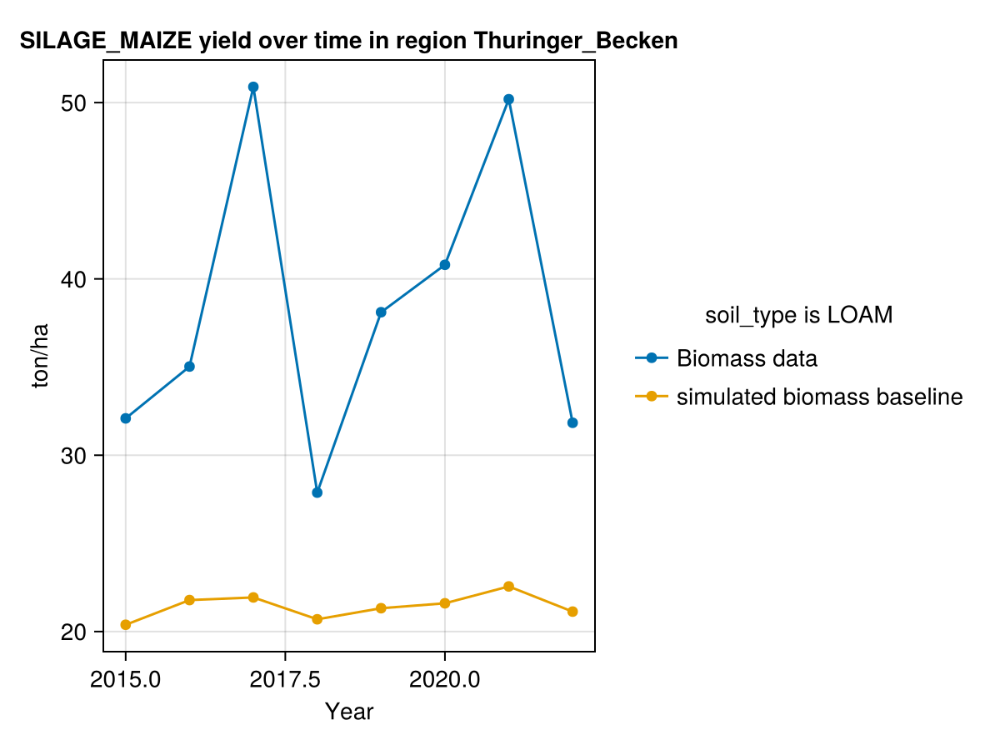

In [27]:
# base line of biomass production

# use the calibrated parameters that we have until now
kw = (
        crop_dict = crop_dict,
     );


biomass_actual = [];
biomass_simulated_baseline = [];
years = [];

# select the biomass data for the given crop_type
yield_df = filter(row->row.crop_type==crop_type, uhk_yield_df);

# for each year that we have data on
for rowi in eachrow(maize_phenology_processed_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end


    append!(years,yeari)
    append!(biomass_actual, yield_df[1,string(yeari)]/10)
    append!(biomass_simulated_baseline, ustrip(cropfield.dayout[end,:Biomass]))
end

CropGrowthTutorial.plot_yearly_data([biomass_actual, biomass_simulated_baseline], ["Biomass data", "simulated biomass baseline"],
                      years, uppercase(crop_type), uppercase(soil_type), station_name)


On last figure we see that our simulated biomass is much lower than the actual value, this can be happening due a lot of factors, from which we will consider the following ones at the moment of calibrating the crop parameters.

1. The crop goes through stresses that reduce the productivity, we have seen the water stresses but we will also analyze the temperature stresses, that are measured by the threshold parameter `GDtranspLow`.
1. The crop variety can have a bigger water productivity than the one considered by default in AquaCrop, the parameter that we care in this case is `WP`.
1. The crop variety grows and dies faster at a faster rate than the simulated, this is controlled by the parameter `GDDCGC` and `GDDCDC`, which we previusly calibrated with a simple heuristic that can be improved with additionaly data about the crop's development.

#### Temperature stress

Let us see the temperature effect on the biomass production


SIMULATION WENT WELL



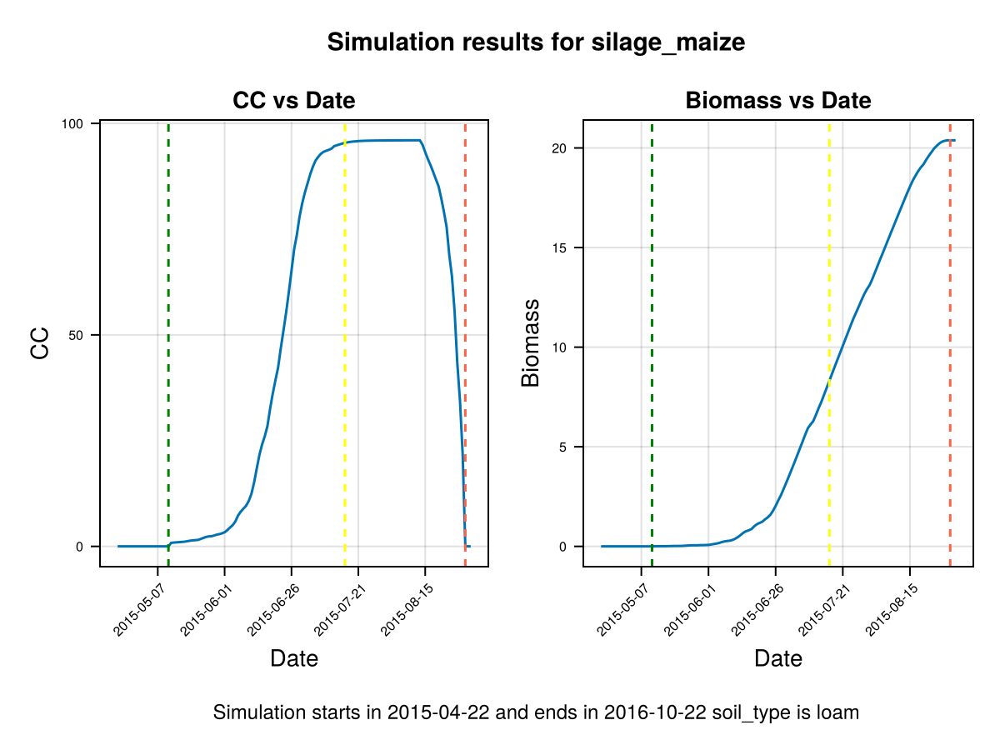

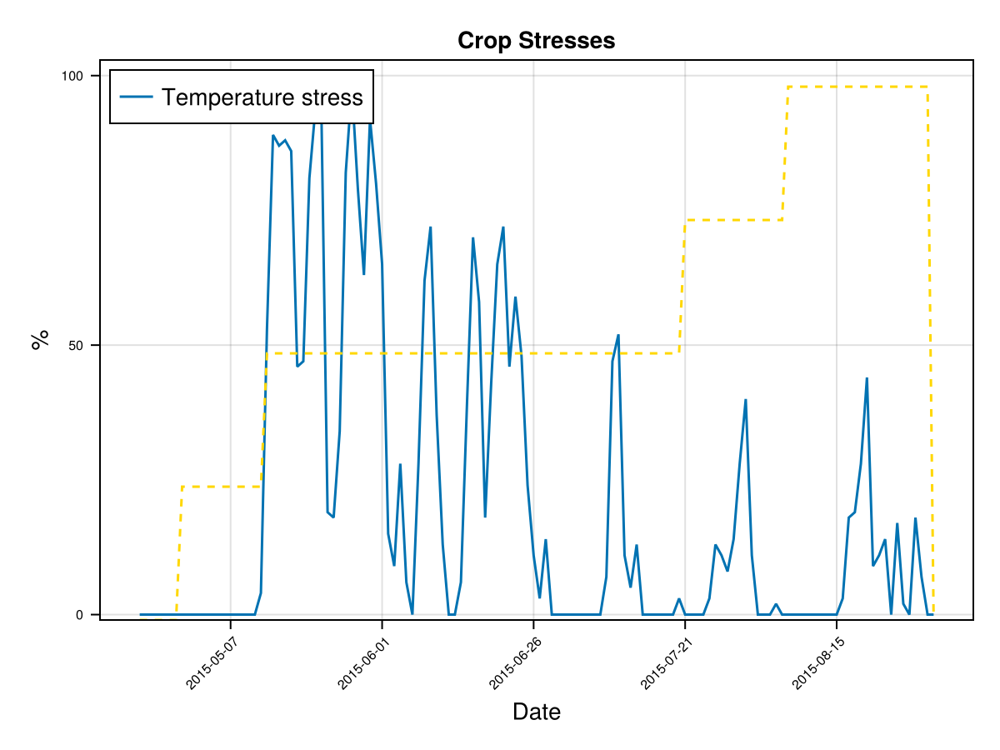

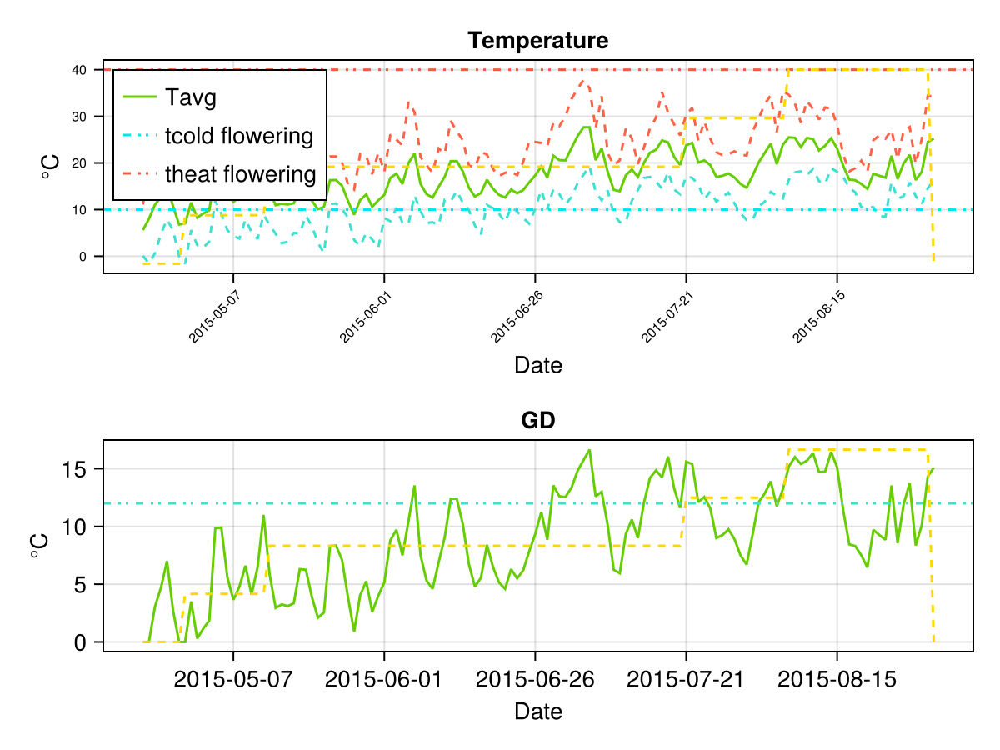

CairoMakie.Screen{IMAGE}


In [28]:
# Crop growth with base line parameters
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type, ["CC", "Biomass"]; kw_plot...))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :temperature))

# plot temperature 
display(CropGrowthTutorial.plot_temp(cropfield))

on last figures we see the crop goes through a lot of temperature stress, this is measured by the parameter `GDtranspLow`. For such a high biomass production we do not expect to have a stressed crop, so we can change it's value such that the crop's simulation behaviour is closer to the observed data. 


SIMULATION WENT WELL



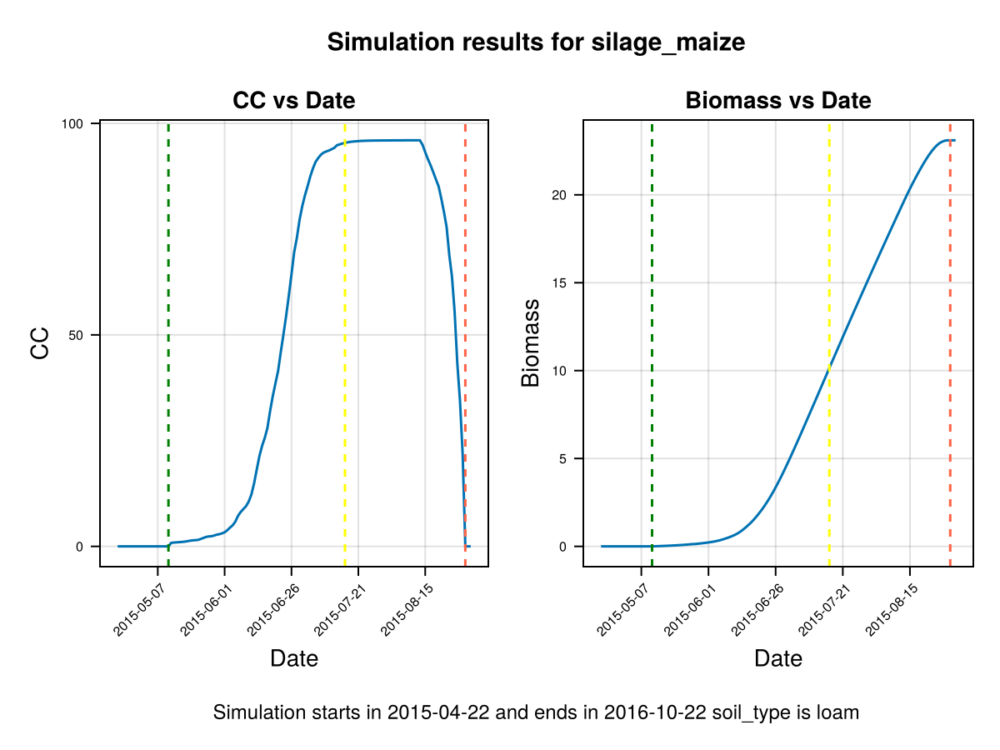

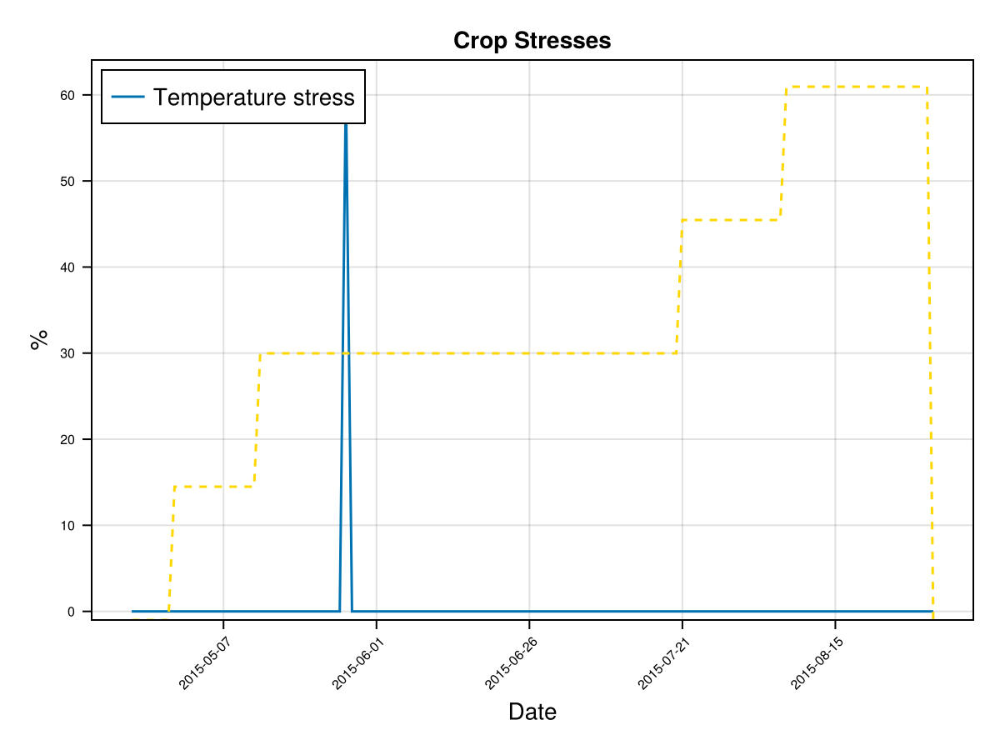

CairoMakie.Screen{IMAGE}


In [29]:
# Crop growth with adjusted GDtranspLow
# for maize default value of GDtranspLow is 12 Celcius avobe the base temperature that is 15, so the crop
# is stressed at 27 Celcius, this is a high temperature for Germany. We change the value to 2 Celcius, then
# the stress beggins at 17 Celcius
crop_dict["GDtranspLow"] = 2.0

kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type, ["CC", "Biomass"]; kw_plot...))

# plot stresses on crop
display(CropGrowthTutorial.plot_crop_stress(cropfield, :temperature))

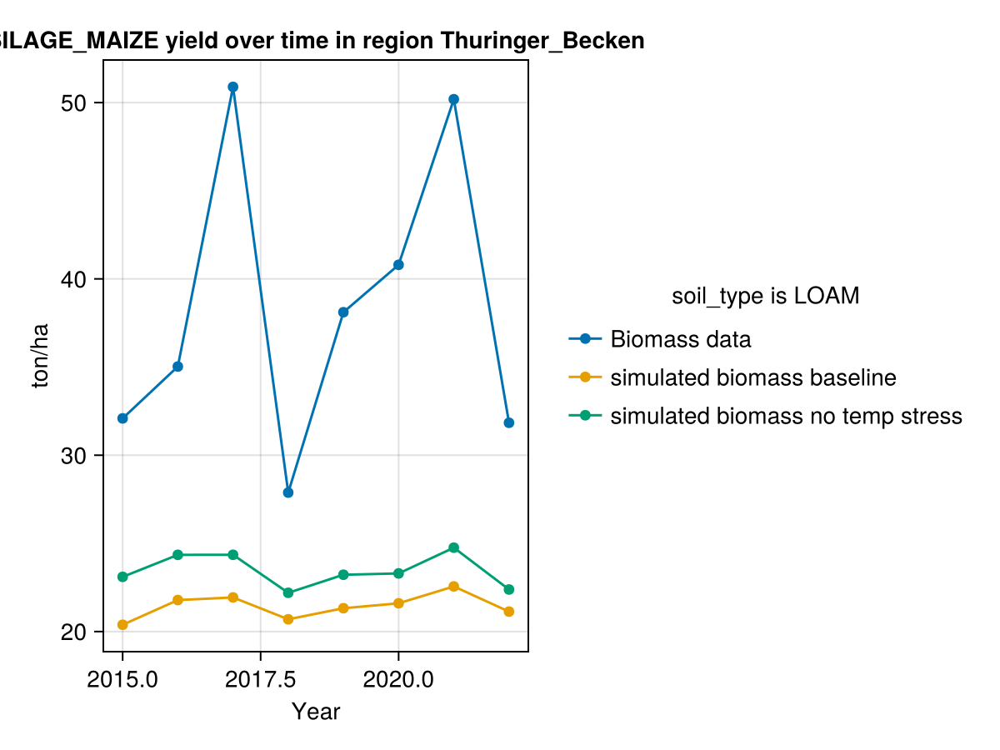

In [30]:
# Biomass production without temperature stress

# use the calibrated parameters that we have until now
kw = (
        crop_dict = crop_dict,
     );

biomass_simulated_temp = [];

# select the biomass data for the given crop_type
yield_df = filter(row->row.crop_type==crop_type, uhk_yield_df);

# for each year that we have data on
for rowi in eachrow(maize_phenology_processed_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end

    append!(biomass_simulated_temp, ustrip(cropfield.dayout[end,:Biomass]))
end

CropGrowthTutorial.plot_yearly_data([biomass_actual, biomass_simulated_baseline, biomass_simulated_temp],
                        ["Biomass data", "simulated biomass baseline", "simulated biomass no temp stress"],
                      years, uppercase(crop_type), uppercase(soil_type), station_name)

#### Water Productivity

Another important factor is the water productivity. AquaCrop's default value is conservative, such that the crop simulation works on several regions. On our case in Germany there isn't usually water deficits, so we can have crops that convert more water to biomass without negative effects.

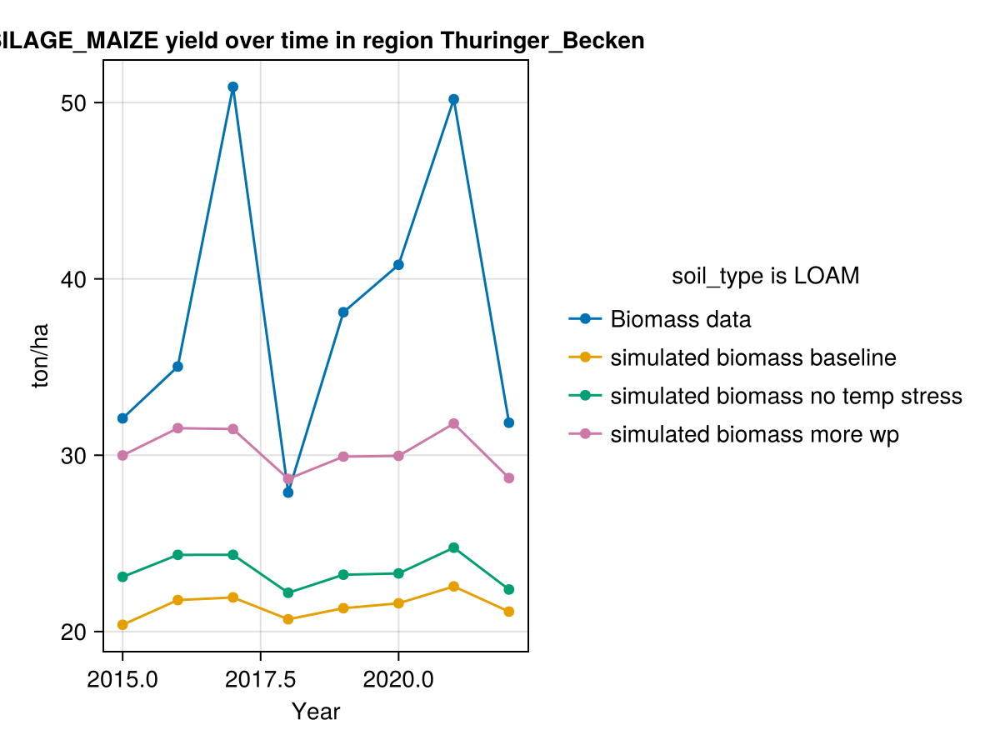

In [31]:
# biomass production increasing Water Productivity

# use the calibrated parameters that we have until now
# the default value of AquaCrop is 33.7, we are changing it in a 33%
crop_dict["WP"] = 33.7 * 1.33
kw = (
        crop_dict = crop_dict,
     );

biomass_simulated_wp = [];

# select the biomass data for the given crop_type
yield_df = filter(row->row.crop_type==crop_type, uhk_yield_df);

# for each year that we have data on
for rowi in eachrow(maize_phenology_processed_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end

    append!(biomass_simulated_wp, ustrip(cropfield.dayout[end,:Biomass]))
end

CropGrowthTutorial.plot_yearly_data([biomass_actual, biomass_simulated_baseline, biomass_simulated_temp, biomass_simulated_wp],
                        ["Biomass data", "simulated biomass baseline", "simulated biomass no temp stress", "simulated biomass more wp"],
                      years, uppercase(crop_type), uppercase(soil_type), station_name)

#### Canopy growth-death reate

Finally, the crop's growth rate directly affetcs the biomass production.


SIMULATION WENT WELL



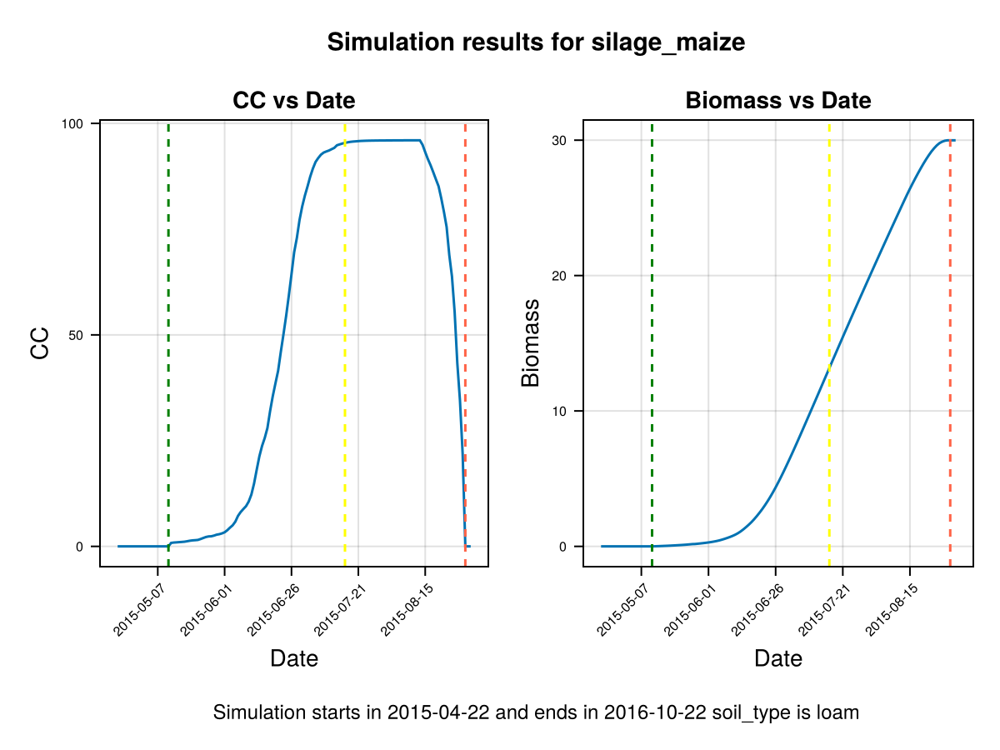

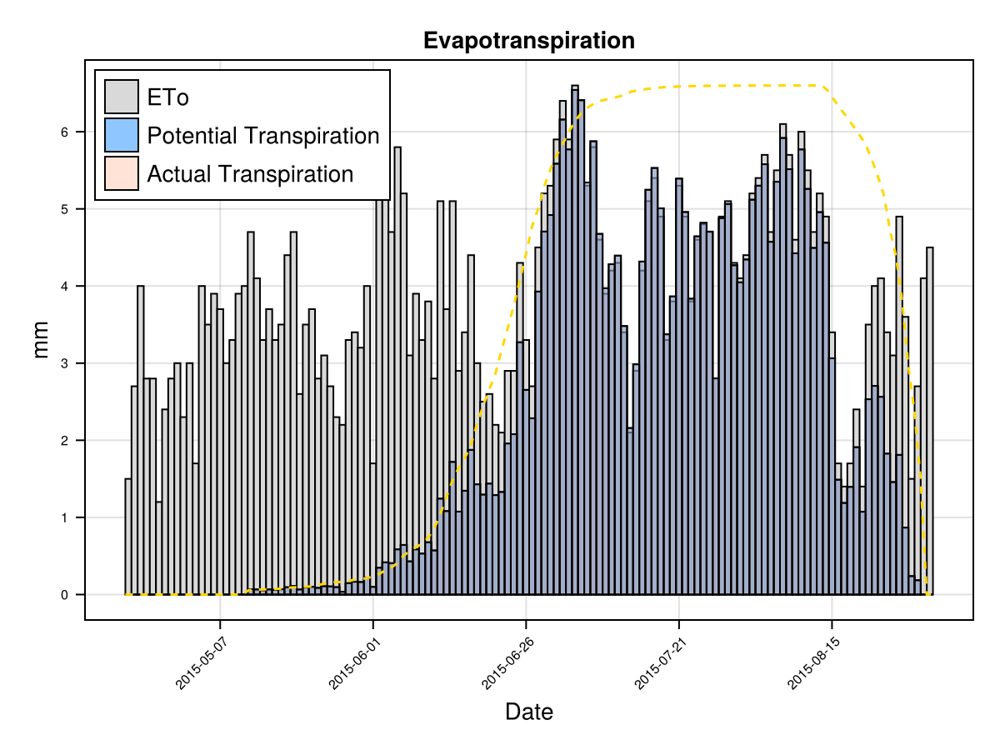

CairoMakie.Screen{IMAGE}


In [32]:
# Crop growth before changing canopy growth rate
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type, ["CC", "Biomass"]; kw_plot...))

# plot crop's evapotranspiration
display(CropGrowthTutorial.plot_eto_tr(cropfield))

The biomass production each day is proportional to the crop's actual transpiration that given day `Tact`, which at the same time it is roughly proportional to the product of the canopy cover and the recorder evapotranspiration `ETo` (or from the climate data the `potential_evapotranspiration`). Then, a faster crop development allows to have more days with bigger canopy cover, given a bigger biomass. This increased canopy growth rate in a summer variety, as the case of maize, can be justified with more experimental data.


SIMULATION WENT WELL



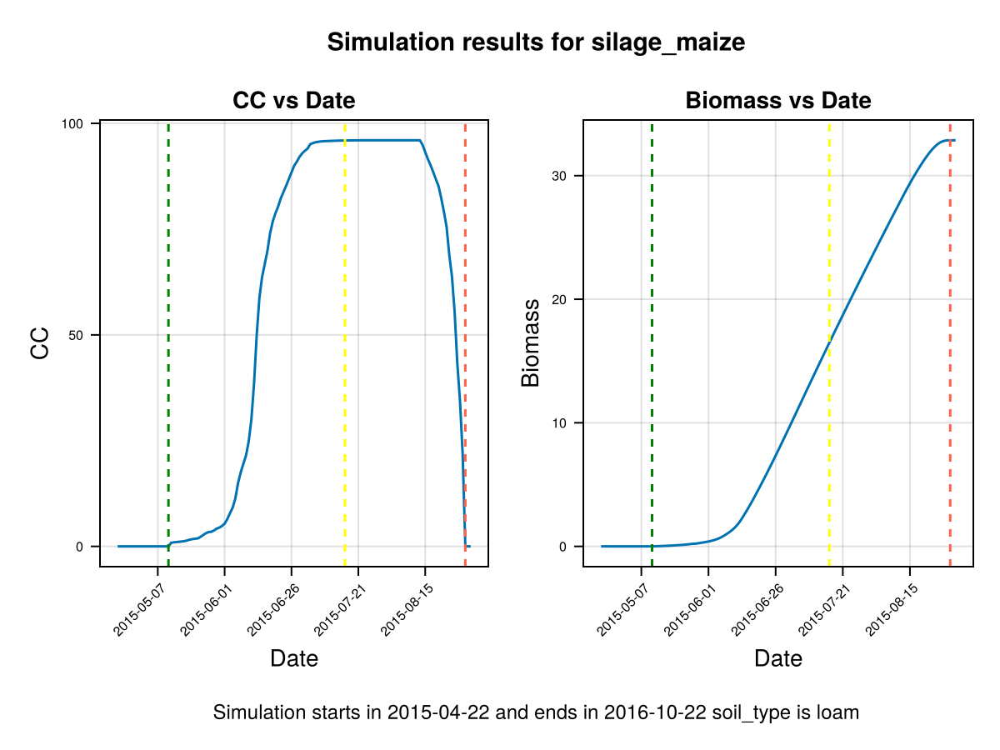

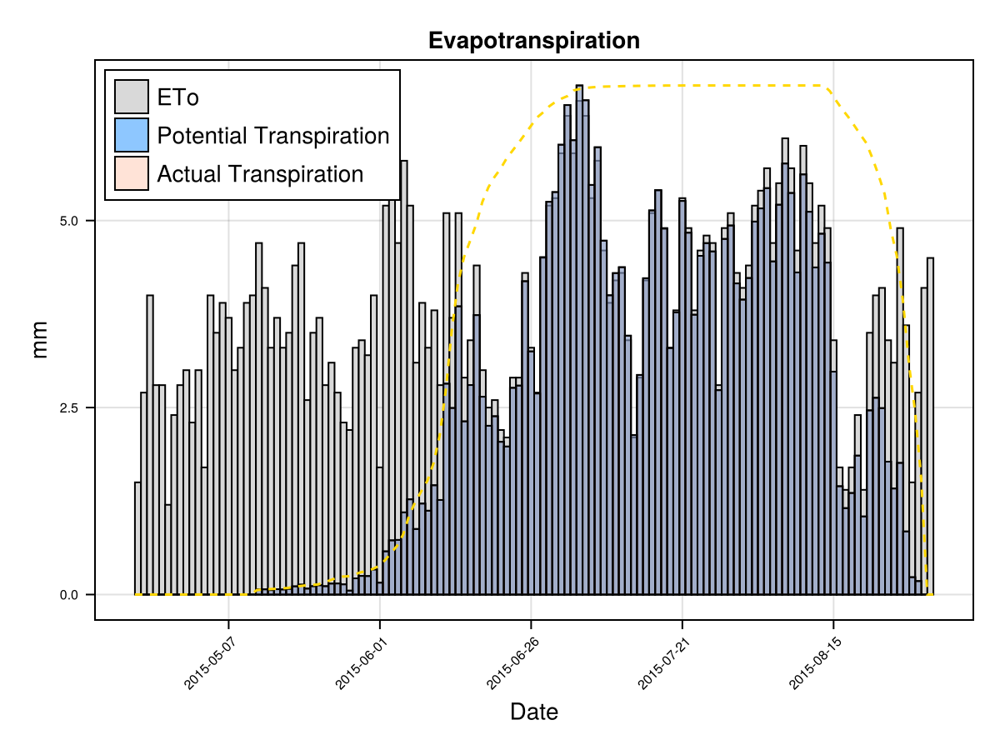

CairoMakie.Screen{IMAGE}


In [33]:
# Crop growth after changing canopy growth-death rate
crop_dict["GDDCGC"] *= 1.33  # say it grows 33% faster than previous simulations
#crop_dict["GDDCDC"] *= 0.9  # say it decays 10% slower than previous simulations

kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end

# plot the results
display(CropGrowthTutorial.plot_daily_stuff_one_year(cropfield, crop_type, soil_type, ["CC", "Biomass"]; kw_plot...))

# plot crop's evapotranspiration
display(CropGrowthTutorial.plot_eto_tr(cropfield))

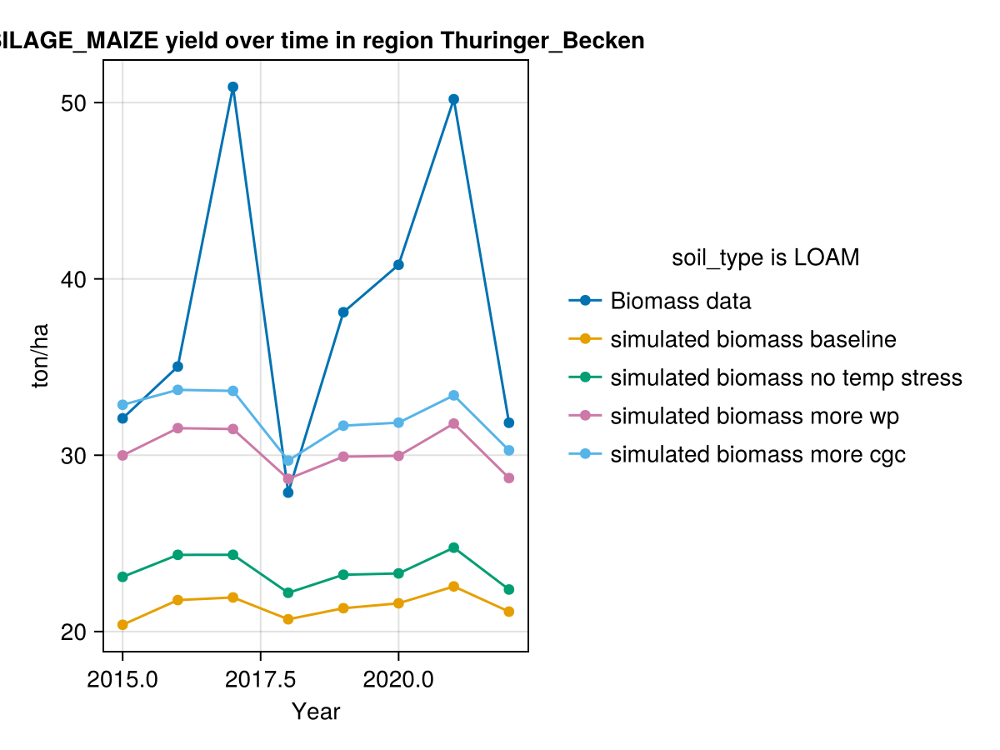

In [34]:
# biomass production increasing CGC

kw = (
        crop_dict = crop_dict,
     );

biomass_simulated_cgc = [];

# select the biomass data for the given crop_type
yield_df = filter(row->row.crop_type==crop_type, uhk_yield_df);

# for each year that we have data on
for rowi in eachrow(maize_phenology_processed_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end

    append!(biomass_simulated_cgc, ustrip(cropfield.dayout[end,:Biomass]))
end

CropGrowthTutorial.plot_yearly_data([biomass_actual, biomass_simulated_baseline, biomass_simulated_temp,
                                    biomass_simulated_wp, biomass_simulated_cgc],
                        ["Biomass data", "simulated biomass baseline", "simulated biomass no temp stress",
                          "simulated biomass more wp", "simulated biomass more cgc"],
                      years, uppercase(crop_type), uppercase(soil_type), station_name)

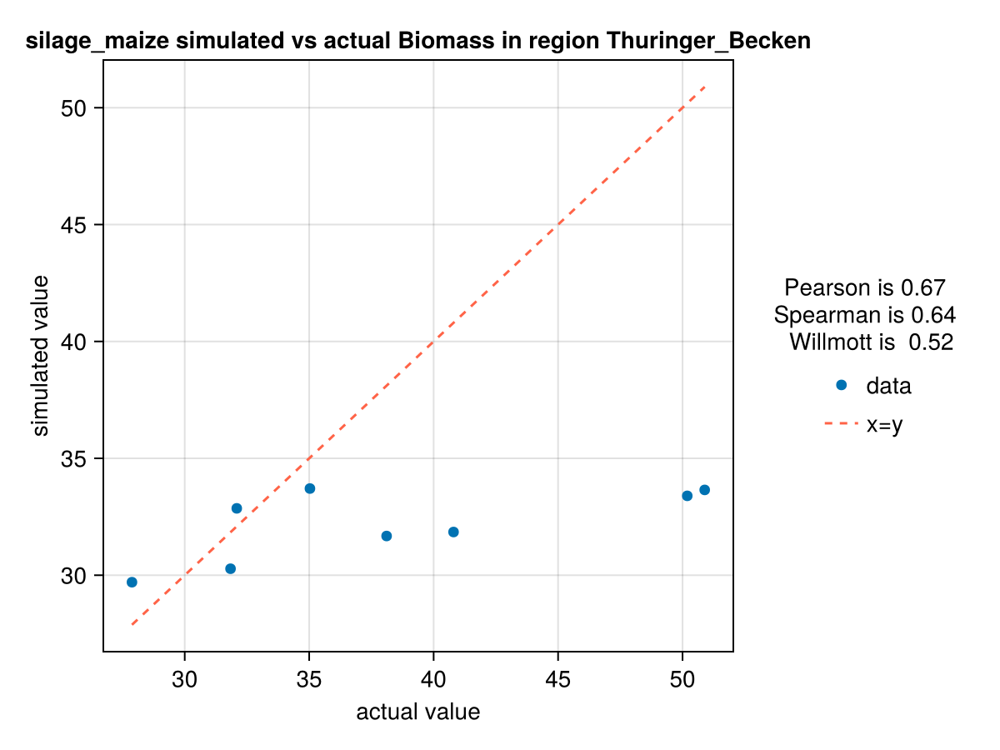

In [35]:
CropGrowthTutorial.plot_correlation(biomass_actual, biomass_simulated_cgc, crop_type, station_name, "Biomass")

In last figure we see the effect of calibrating each parameter on the biomass production. Further studies are required to reproduce the high production years.

### Yield

On our database we are using silage maize, we do not have information about the corns/grains, nevertheless we will show the effect of the most important parameters on the Yield production of grain/frui crops:

1. Harvest Index `HI`. Says te proportion of Biomass that is converted to Yield.
1. The air temperature during pollination has the thresholds `Tupper` and `Tcold`, in temperatures outside this range the pollination starts to fail.


#### Harvest Index

In the following figures we show the effect of changing the default value of AquaCrop's maize Harvest Index. We can see that greater `HI` means greater Yield.


SIMULATION WENT WELL


SIMULATION WENT WELL


SIMULATION WENT WELL



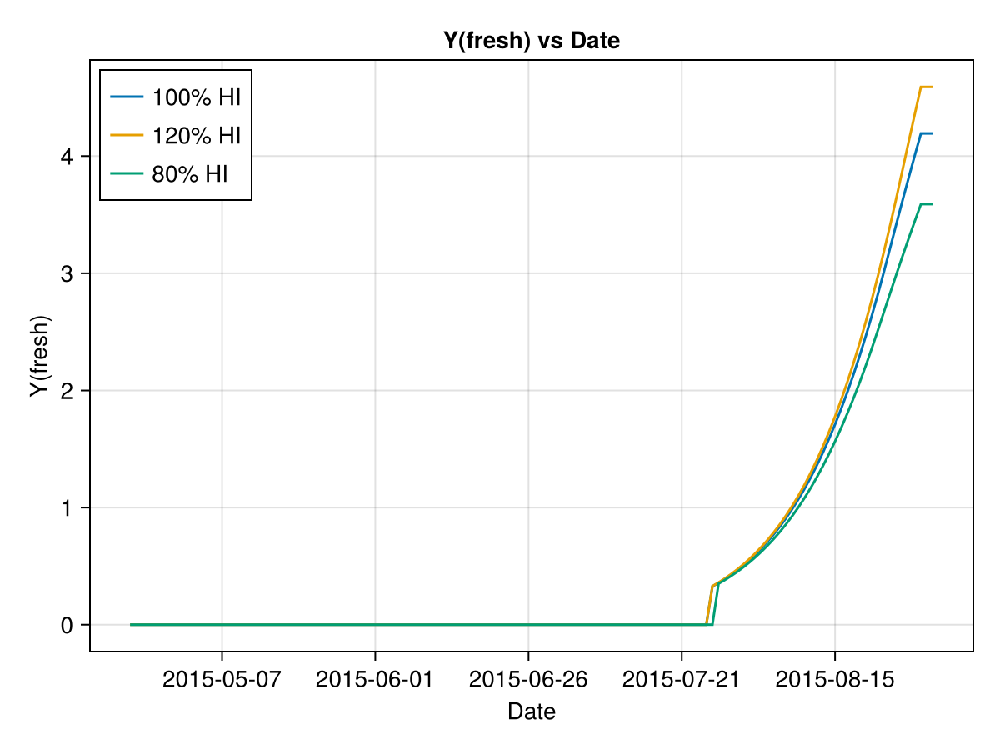

In [36]:
# Crop growth before changing Harvest Index
kw = (
        crop_dict = crop_dict,
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield_0, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end




# Crop growth increasing the Harvest index by 20 %
kw = (
        crop_dict = merge(crop_dict, Dict("HI" => round(Int,48*1.2))),
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield_M, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end



# Crop growth decreasing the Harvest index by 20 %
kw = (
        crop_dict = merge(crop_dict, Dict("HI" => round(Int,48*0.8))),
     );

# the simulation's date is one for which we have phenology data
i = 1;
sowing_date = maize_phenology_processed_df[i,:sowingdate]

# run a simulation sending the additional kw
cropfield_m, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, uhk_clim_df; kw...);

# check if all is ok with the simulation
if all_ok.logi
    println("\nSIMULATION WENT WELL\n")
else
    println("\nBAD SIMULATION, error\n")
    println(all_ok.msg)
    println("")
end


# plot the results

xx = findlast(x->x==4, cropfield_0.dayout.Stage) + 1
f = Figure()
coli = "Y(fresh)"
ax = Axis(f[1, 1],
    title = coli*" vs Date",
    xlabel = "Date",
    ylabel = coli,
)
x = cropfield_0.dayout[1:xx,"Date"]
lines!(ax, x, ustrip.(cropfield_0.dayout[1:xx, coli]), label="100% HI")
lines!(ax, x, ustrip.(cropfield_M.dayout[1:xx, coli]), label="120% HI")
lines!(ax, x, ustrip.(cropfield_m.dayout[1:xx, coli]), label="80% HI")
axislegend(position = :lt)


f

#### Temperature Thresholds

For grain/fruit corps we have some temperature thresholds during pollination, if the climate temperature is outside this range it causes crop stresses at the moment of producing yield. Although the threshold parameters are not calibrated, it is useful to plot their values and also the daily minimal and maximal temperature, in this way we can see if our crop has yield stresses during pollination. See the following figure

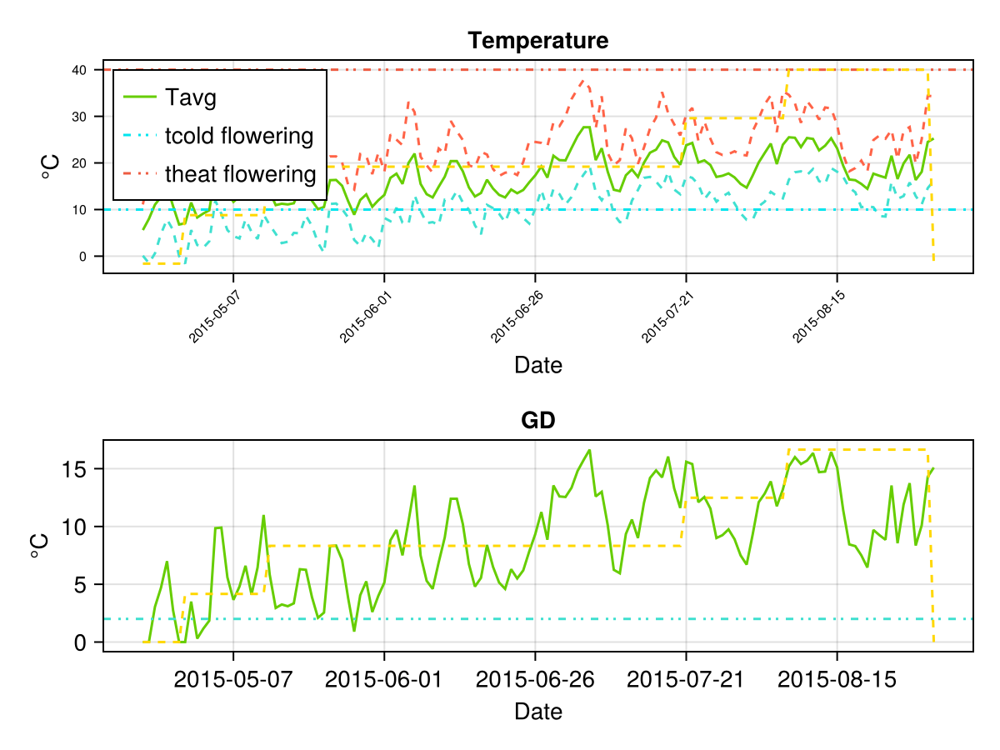

In [37]:
# Temperature variables and thresholds
CropGrowthTutorial.plot_temp(cropfield_0)

## Full calibration

In the following code we will collect the data for winter wheat, and make the crop's parameters full calibration.

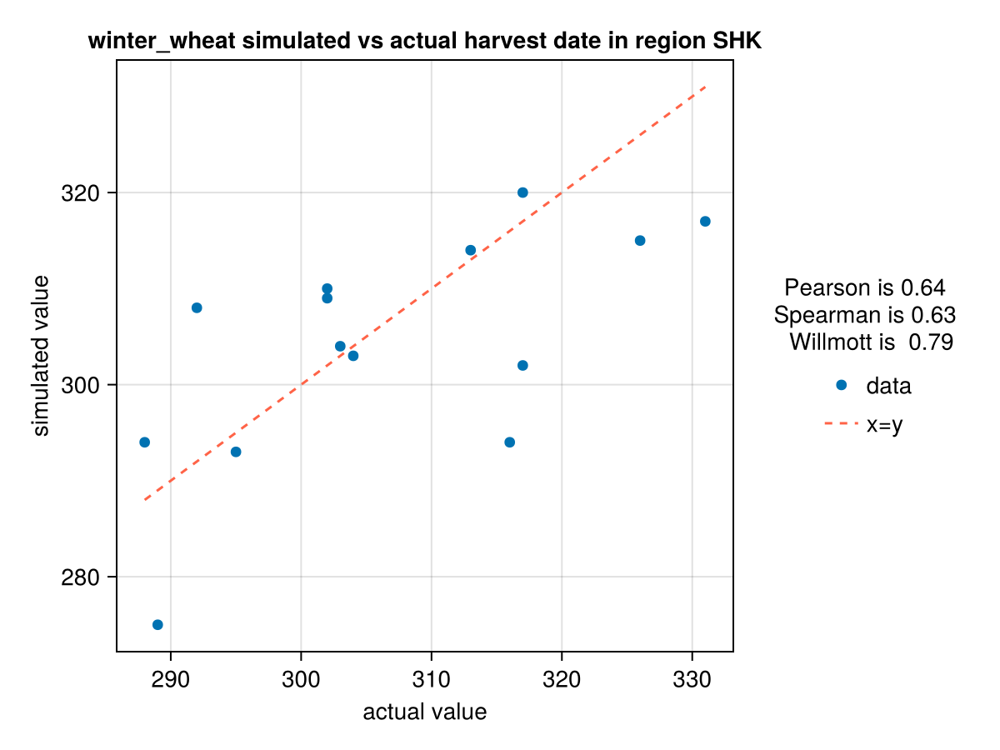

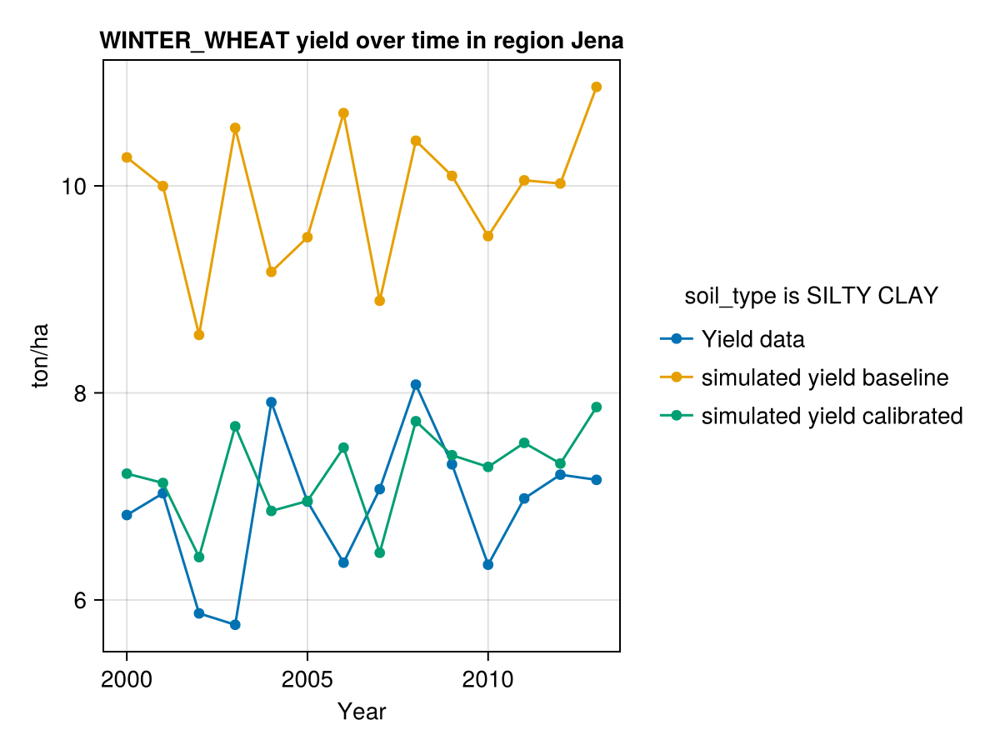

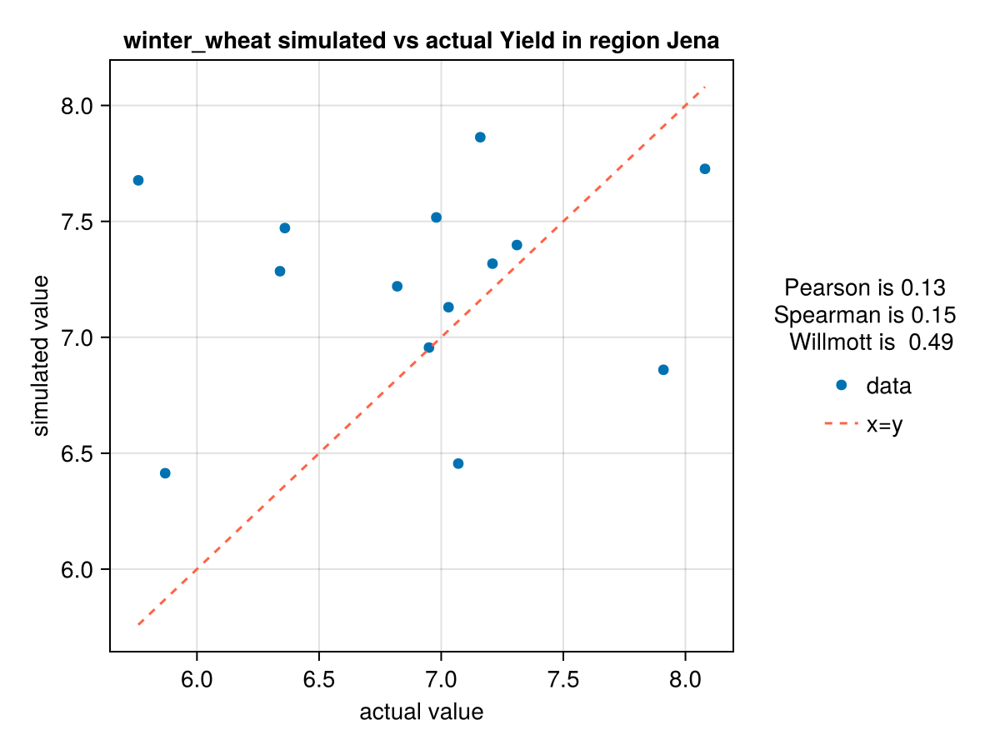

CairoMakie.Screen{IMAGE}


In [38]:
## SET THE DATA ##

# Select a station's short_name
station_name = "Jena";

# Select a crop_type 
crop_type = "winter_wheat";

# Climate data for a given station
shk_clim_df =  CropGrowthTutorial.get_climate_data(station_name);

# Field yield data for a given station
shk_yield_df = CropGrowthTutorial.get_yield_data(station_name);

# Crop's phenology raw data for a given station
wwheat_phenology_raw_df = CropGrowthTutorial.get_crop_phenology_data(crop_type, station_name);

# get the soil_type for the given station
soil_type = filter(row -> row.station_name==station_name, stations_df)[1,:soil_type];

# get the aquacrop_name for the given crop_type
crop_name = filter(row -> row.crop_type==crop_type, general_crop_data_df)[1,:aquacrop_name];

# get the planting density for the given crop_type
plantingdens = filter(row -> row.crop_type==crop_type, general_crop_data_df)[1,:plantingdens];

# create a kw tuple with the additional information that we wish to pass to AquaCrop
kw = ( crop_dict = Dict{String,Any}("PlantingDens" => plantingdens),);

# select a sowing phase and harvest phase for the crop  start the phenology calibration
sowing_phase = 10;
harvest_phase = 24;


## CALIBRATION ##

# 1. Calibrate Phenology 
crop_dict, ww_phenology_df = CropGrowthTutorial.calibrate_phenology_parameters(wwheat_phenology_raw_df, crop_name, shk_clim_df, 
                                                  sowing_phase, harvest_phase; kw...)

# Plot the partial results until now
f = CropGrowthTutorial.plot_correlation(ww_phenology_df[:,:harvest_actualdays], ww_phenology_df[:,:harvest_simulateddays], crop_type, "SHK", "harvest date");
display(f)


# 2. Calibrate the canopy growth parameters
CropGrowthTutorial.calibrate_canopy_root_parameters!(crop_dict, crop_name);

# base line of yield production
# use the calibrated parameters that we have until now
kw = (
        crop_dict = crop_dict,
     );
yield_actual = [];
yield_simulated_baseline = [];
years = [];
# select the biomass data for the given crop_type
yield_df = filter(row->row.crop_type==crop_type, shk_yield_df);
# for each year that we have data on
for rowi in eachrow(ww_phenology_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, shk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end

    append!(years,yeari)
    append!(yield_actual, yield_df[1,string(yeari)]/10)
    append!(yield_simulated_baseline, ustrip(cropfield.dayout[end,"Y(fresh)"]))
end


# 3. Calibrate biomass-yield parameters
CropGrowthTutorial.calibrate_biomass_yield_parameters!(crop_dict, crop_name, soil_type, shk_clim_df, :Yield,  ww_phenology_df, yield_actual)

# new yield production after calibration
kw = (
        crop_dict = crop_dict,
     );
yield_simulated_calibrated = [];
# for each year that we have data on
for rowi in eachrow(ww_phenology_df)
    sowing_date = rowi.sowingdate
    yeari = rowi.year
    # run a simulation sending the additional kw
    cropfield, all_ok = CropGrowthTutorial.run_simulation(soil_type, crop_name, sowing_date, shk_clim_df; kw...);
    # check if all is ok with the simulation
    if !all_ok.logi
        println("\nBAD SIMULATION, error\n")
        println(all_ok.msg)
        println("on year ",yeari)
        println("")
        continue
    end
    append!(yield_simulated_calibrated, ustrip(cropfield.dayout[end,"Y(fresh)"]))
end

# Plot results of calibration
display(CropGrowthTutorial.plot_yearly_data([yield_actual, yield_simulated_baseline,
                                    yield_simulated_calibrated],
                        ["Yield data", "simulated yield baseline",
                          "simulated yield calibrated"],
                      years, uppercase(crop_type), uppercase(soil_type), station_name))

display(CropGrowthTutorial.plot_correlation(yield_actual, yield_simulated_calibrated, crop_type, station_name, "Yield"))


In last figure see that we have problems simulating the years with low production of yield. 

## References

[1]https://github.com/brry/rdwd

[2]https://statistik.thueringen.de/datenbank/TabAnzeige.asp?tabelle=kr000516%7C%7C